# Pose pipeline tutorial

(Single-modal) In this tutorial, we demonstrate how to perform the POSE pipeline on Breast Cancer (BC) RNA data from TCGA. This analysis entails the following:

1. Upload data
2. Compute pairwise sample (WE) distances with respect to gene neigborhoods 
3. Compute global pairwise sample (WE) distance matrices
4. Convert global distances to a single sample pairwise similarity matrix
5. (Future work - dpt distance and/or multi-scale diffusion based distances)
6. Extract pseudo-organization (i.e., ordering) of samples.
7. Determine schema (i.e., branching).
8. Visualize schema
9. (Future work - further investigation into samples within different branches and differential analysis between branches)

- $d_W(i,j,v)$ - The Wasserstein distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $d_E(i,j,v)$ - The Euclidean distance of the 1-hop neighborhood around gene $v$ between sample $i$ and sample $j$
- $D_W(i,j) = |d_W(i,j,v)|$ - Net Wasserstein distance between sample $i$ and sample $j$ wrt all genes $v$
- $D_E(i,j) = |d_E(i,j,v)|$ - Net Euclidean distance between sample $i$ and sample $j$ wrt all genes $v$
- $K_W = e^{-\frac{\|D_W\|^2}{\sigma^2}}$ - Pairwise sample Wasserstein similarity matrix 
- $K_E = e^{-\frac{\|D_E\|^2}{\sigma^2}}$ - Pairwise sample Euclidean similarity matrix 
- (Multi-feature, multi-modal) $K = \frac{K_W + K_E}{2}$ - Fused pairwise sample similarity matrix
- $D = 1 - K$ - Fused pairwise sample distance matrix
- (Clustering) Determine branching according to lineage tracing algorithm using $D$ 
- (Visualizing) Pseudo-ordering of samples in branches according to distance from root node $r$, i.e., $D(r,:)$

__Aknowledgement__
- The diffusion distance and pseudo-ordering is performed according to the lineage tracing algorithm presented in Haghverdi, et al. (2019). 
- The code for computing the ordering is largely adopted from the scanpy implementation in Python.


__Input__
- `X` : RNA-Seq data matrix
- `genelist` : list of genes of interest in `X`
- `G` : gene-gene (or protein-protein) interaction network

__Algorithm__
1. Compute sample-pairwise gene-1-hop-neighborhood distances:
    - Wasserstein distances (shape): For each gene `g` in the `genelist`, compute $$d_W^{(g)}(sample_i, sample_j)$$ which is the Wasserstein distance of gene `g`'s 1-hop neighborhood between every two samples `i` and `j`.
    - Euclidean distances (scale): For each gene `g` in the `genelist`, compute $$d_E^{(g)}(sample_i, sample_j)$$ which is the Euclidean distance of gene `g`'s 1-hop neighborhood (including self) between every two samples `i` and `j`.
2. Compute net sample-pairwise distances:
    - Wasserstein distance (shape): $$d_W(sample_i, sample_j) = |d_W^{(g)}(sample_i, sample_j)|$$ as the $L_1$ or $L_2$ norm of the vector of gene-1-hop-neighborhood Wasserstein distances for all genes `g` in the `genelist`.
    - Euclidean distance (scale): $$d_E(sample_i, sample_j) = |d_E^{(g)}(sample_i, sample_j)|$$ as the $L_1$ or $L_2$ norm of the vector of gene-1-hop-neighborhood Euclidean distances for all genes `g` in the `genelist`.
3. Convert net sample-pairwise distances to standardized similarities:
    - $\sigma$ : Kernel width representing each data point's accessible neighbors. 
    - Set $\sigma$ normalization for each obs as the distance to its k-th neighbor : $$K_{ij}(d) = \sqrt{\frac{2\sigma_i\sigma_j}{\sigma_i^2 + \sigma_j^2}}e^{-\frac{|d_{ij}^2|}{2(\sigma_i^2 + \sigma_j^2)}}$$
where for each observation $i$, $\sigma_i$ is the distance to its $k$-th nearest neighbor.
        - Standardized sample-pairwise Wasserstein similarity: $$K_W = K(d_W)$$
        - Standardized sample-pairwise Euclidean similarity: $$K_E = K(d_E)$$
4. Compute fused sample-pairwise distance $d_F$:
    - $d_F = 1 - \frac{K_W + K_E}{2}$ (Note : could choose other weights to fuse with an unbalanced combination)
<!-- 5. Compute sample-pairwise co-branch frequency from pseudo-organization:
    - Compute pseudo-organization branching using each sample as the root.
    - Count the number (or percentage) of times every two samples are found in the same branch - `tracker(sample_i, sample_j)`
6. Cluster samples and generate organization schema:
    - user specified parameters:
        - `percentage (0 < percentage <= 100)` : Percentage of pseudo-organizations that samples must be found in the same branch to be considered part of the same cluster.
        - `min_clus_component_size (1 <= min_clus_component_size <= largest number of samples within a single connected component)` : Remove each cluster where the connected component it belongs to has less than `min_island_clus_size` samples collectively.
    - approach for constructing the schema:
        - For each sample `i`, identify cluster `c_i` where $$c_i = \{ i \} \cup \{ j : tracker(i, j) >= percentage \}, $$ which is represented as a node in the schema.
        - Draw an edge between every two clusters/nodes (e.g., `c_i` and `c_j`) where there is an overlap in the samples associated with each clusters/nodes.
        - Remove connected components in the schema associated with less than `min_clus_component_size` samples, collectively.
        - (To do:) Draw fictitious edges to connect the connected-components based on inter-pseudo-organization distance

 -->

First, import the necessary packages:

# Load libraries

In [1]:
import pathlib
import sys

from collections import defaultdict as ddict
import itertools
import json
import matplotlib.colors as cm
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import scipy.sparse as sc_sparse
from tqdm import tqdm

In [2]:
import warnings

If ``netflow`` has not been installed, add the path to the library:

In [3]:
sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[3].resolve().as_posix())
# sys.path.insert(0, pathlib.Path(pathlib.Path('.').absolute()).parents[0].resolve().as_posix())

In [7]:
import netflow as nf

In [8]:
from netflow.probe import visualization as nfv

# Set up directories

In [9]:
MAIN_DIR = pathlib.Path('.').absolute()

Paths to where data is stored:

In [10]:
DATA_DIR = MAIN_DIR / 'example_data' / 'breast_tcga'

RNA_FNAME = DATA_DIR / 'rna_606.txt'
E_RNA_FNAME = DATA_DIR / 'edgelist_hprd_rna_606.txt'

CNA_FNAME = DATA_DIR / 'cna_606.txt'
E_CNA_FNAME = DATA_DIR / 'edgelist_hprd_cna_606.txt'

METH_FNAME = DATA_DIR / 'methylation_606.txt'
E_METH_FNAME = DATA_DIR / 'edgelist_hprd_methylation_606.txt'

CLIN_FNAME = DATA_DIR / 'clin_606.txt'

Directory where output should be saved:

In [11]:
OUT_DIR = MAIN_DIR / 'example_data' / 'results_netflow_breast_tcga'

# Load clinical data

In [13]:
clin = pd.read_csv(CLIN_FNAME, header=0, index_col=0)
print(clin.shape)

(606, 34)


# Initialize the Keeper

We use the same bulk-RNA TCGA breast cancer data (specifically, the RNA and methylation) as previously described in the Keeper tutorial. 

In [15]:
# uncomment to initialize Keeper with no output directory:
# keeper = nf.Keeper() 

# initializing Keeper with output directory:
keeper = nf.Keeper(outdir=OUT_DIR)

Load the feature data (RNA and methylation) from file:

In [17]:
keeper.load_data(RNA_FNAME, label='rna', header=0, index_col=0) 
# keeper.load_data(METH_FNAME, label='meth', header=0, index_col=0)

Load the associated graphs from their edgelist files:

In [19]:
keeper.load_graph(E_RNA_FNAME, label='rna')
# keeper.load_graph(E_METH_FNAME, label='meth')

# Compute observation-pairwise distances

We can compute observation-pairwise distances with respect to the feature data. This can be performed on all features, but here we select a specific set of immune related features for demonstration.

In [20]:
gene_sig_label = 'immune_signature'
gene_sig = ['ACTB', 'CCR5', 'CD163', 'CD247', 'CD28', 'CD3D', 'CD3E', 'CD3G', 
            'CD4', 'CD80', 'CD86', 'CD8A', 'CD8B', 'GZMA', 'GZMB', 'IFNG', 
            'IL10', 'IL1A', 'IL1B', 'IL6', 'ITGB7', 'ITK', 'KLF10', 'LAT', 
            'LCK', 'LCP2', 'PTPN6', 'SNAI1', 'TGFB2', 'TGFBR1', 'TGFBR2', 
            'TNF', 'TUBA1A', 'VAV1', 'VEGFA', 'ZAP70', 'ZEB1']
print(len(gene_sig))

37


We check that all features in `gene_sig` are also in the graphs:

## Feature neighborhood distances

In [21]:
for dd in keeper.data:
    keeper.wass_distance_pairwise_observation_feature_nbhd(dd.label, dd.label, features=gene_sig,
                                                           include_self=False, label=gene_sig_label)

netflow.methods.classes: 07/26/2024 01:27:43  PM | MSG |                                                           
classes:multiple_pairwise_observation_neighborhood_wass_distance:815 | >>> Loaded saved observation pairwise 1-hop 
neighborhood Wasserstein distances from rna_immune_signature_wass_dist_observation_pairwise_nbhds_without_self     
profiles of size (183315, 36).

In [22]:
# for dd in keeper.data:
#     keeper.euc_distance_pairwise_observation_feature_nbhd(dd.label, dd.label, features=gene_sig,
#                                                            include_self=False, label=gene_sig_label,
#                                                            metric='euclidean')

### Distance from a single feature neighborhood

In [23]:
rna_CD28_nbhd_wass_dist = keeper.misc[f"rna_{gene_sig_label}_wass_dist_observation_pairwise_nbhds_without_self"]['CD28']
rna_CD28_nbhd_wass_dist.head()

observation_a    observation_b  
TCGA-E9-A295-01  TCGA-AR-A1AS-01    0.226186
                 TCGA-AQ-A1H2-01    0.223247
                 TCGA-A8-A08O-01    0.246211
                 TCGA-BH-A1FJ-01    0.322797
                 TCGA-JL-A3YX-01    0.382493
Name: CD28, dtype: float64

In [24]:
keeper.add_stacked_distance(rna_CD28_nbhd_wass_dist, 'wass_dist_rna_CD28_nbhd')

### Distance from norm of feature neighborhood distances

In [18]:
# misc_key = f"rna_{gene_sig_label}_wass_dist_observation_pairwise_nbhds_without_self"
# distance_label = f"norm_{misc_key}"
# nf.methods.metrics.norm_features_as_sym_dist(keeper, misc_key,label=distance_label,
#                                              features=None, method='L1')

## Feature profile distances

In [19]:
# for dd in keeper.data:    
#     # Wasserstein distances:
#     keeper.wass_distance_pairwise_observation_profile(dd.label, dd.label, 
#                                                       features=gene_sig, label=gene_sig_label,                                                      
#                                                       graph_distances=None, edge_weight=None)

#     # Euclidean distances:
#     keeper.euc_distance_pairwise_observation_profile(dd.label, features=gene_sig, label=gene_sig_label)                                                                  

# Compute similarities from distances

In [25]:
n_neighbors = 5

for dd in keeper.distances:
    keeper.compute_similarity_from_distance(dd.label, n_neighbors, 'max',                                                    
                                            label=None, knn=False)

We can see the labels of all the similarities that have been added to the keeper (one for each distance that was in the keeper):

In [21]:
print(*[dd.label for dd in keeper.similarities], sep='\n')

similarity_max5nn_wass_dist_rna_CD28_nbhd


# Fused similarities

We can take any combination of similarities and add them as a fused similarity to the keeper.

For example, we can fuse the Wasserstein and Euclidean RNA profile distances. 

This can be done in two ways : 

1. Explicitly, by computing the fused distance and then adding it to the keeper or,
2. implicitly, using the keeper's method `fuse_similarities`. In this approach, you provide:
    - `similarity_keys` : the list of keys referencing the similarities that should be fused
    - `weights` (optional) : weights for how much each similarity should contribute to the fusion. The default behavior is to assign uniform weights and compute the average. 
    - `fused_key` (optional) : the key used to store the fused similarity in the keeper. The default behavior is to fuse the keys of the original similarities. 

In [22]:
# keeper.fuse_similarities(['similarity_max5nn_rna_immune_signature_wass_dist_observation_pairwise_profiles',
#                           'similarity_max5nn_rna_immune_signature_euc_dist_observation_pairwise_profiles'],
#                          # weights=None,  # uncomment to add fused weighting
#                         )

We can see that the fused similarity has been added to the Keeper with the key
`'fused_similarity_max5nn_rna_immune_signature_wass_euc_dist_observation_pairwise_profiles'`:

In [23]:
print(*[dd.label for dd in keeper.similarities], sep='\n')

similarity_max5nn_wass_dist_rna_CD28_nbhd


Or, we can fuse the RNA and methylation Wasserstein profile distances:

In [24]:
# keeper.fuse_similarities(['similarity_max5nn_rna_immune_signature_wass_dist_observation_pairwise_profiles',
#                           'similarity_max5nn_meth_immune_signature_wass_dist_observation_pairwise_profiles'])

We can check that it has been added to the similarities:

In [25]:
# 'fused_similarity_max5nn_rna_meth_immune_signature_wass_dist_observation_pairwise_profiles' in keeper.similarities

- Since the similarities range from 0 to 1 (0 being the least similar and 1 being the most similar), we can transform them into distances by taking 1-similarity. 

Next, we add the distances from each similarity to `keeper.distances`, so they can be used in later analysis:

In [26]:
# for dd in keeper.similarities:
#     keeper.convert_similarity_to_distance(dd.label)

# Compute diffusion distances

Next we show how to compute the multi-scale diffusion distance from a similarity. This entails computing the transition matrix associated with the similarity which is stored in the misc keeper. 

To compute the diffusion distance for each similarity, we simply loop through the similarities stored in the keeper. See the documentation for a description of additional options.

In [26]:
for sim in keeper.similarities:
    keeper.compute_dpt_from_similarity(sim.label, density_normalize=True)

In [23]:
# for sim in keeper.similarities:
#     keeper.compute_transitions_from_similarity(sim.label, density_normalize=True)
#     T_sym_label = f"transitions_sym_{sim.label}"
#     keeper.compute_dpt_from_augmented_sym_transitions(T_sym_label)

# Compute the POSE

The POSE can be computed from any distance in the keeper. We demonstrate this next using the multi-scale Wasserstein distance between RNA immune signature profiles, with the reference key `'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_wass_dist_observation_pairwise_profiles'` in the keeper.

The `POSER` class is used to perform the iterative branching and keep track the branches and their splits.
The final __POSE__, i.e., the **P**seudo-**O**rganizational **S**tructur**E** of the observations is returned as a graph where each observation is represented as a node. The edges show the organizational relationship determined from the ordering (lineage tracing algorithm) and nearest neighbors (alleviates strict assumptions of lineage tracing that do not apply).

In [24]:
print(*[dd.label for dd in keeper.distances], sep='\n')

wass_dist_rna_CD28_nbhd
dpt_from_transitions_sym_similarity_max5nn_wass_dist_rna_CD28_nbhd


In [28]:
# key = 'distance_from_fused_similarity_max5nn_rna_meth_immune_signature_wass_dist_observation_pairwise_profiles'
# key = 'dpt_from_transitions_sym_similarity_max5nn_norm_rna_immune_signature_wass_dist_observation_pairwise_nbhds_without_self'
# key = 'dpt_from_transitions_sym_similarity_max5nn_meth_immune_signature_wass_dist_observation_pairwise_profiles'
# key = 'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_euc_dist_observation_pairwise_profiles'
# key = 'dpt_from_transitions_sym_similarity_max5nn_meth_immune_signature_euc_dist_observation_pairwise_profiles'
# key = 'dpt_from_transitions_sym_similarity_max5nn_rna_immune_signature_wass_dist_observation_pairwise_profiles'
# key = 'dpt_from_transitions_sym_fused_similarity_max5nn_rna_immune_signature_wass_euc_dist_observation_pairwise_profiles'
key = 'dpt_from_transitions_sym_similarity_max5nn_wass_dist_rna_CD28_nbhd'

poser, G_poser_nn = keeper.construct_pose(key, n_branches=5, min_branch_size=10,
                                          until_branched=True, verbose='ERROR')

## A closer look at the POSER

First, we can get the index of the observation that was used as the root:

In [29]:
poser.root

433

We can also get the label of the root observation:

In [30]:
keeper.observation_labels[poser.root]

'TCGA-OL-A5RW-01'

We can get an overview of the branching:

In [31]:
poser.tree.root.disp()

            ┌1 (n = 58)
            ├2 (n = 60)
            │                   ┌0 - trunk (n = 13)
            │                   ├4 (n = 2)
            ├0 - trunk (n = 113)┤
            │                   ├6 (n = 97)
            │                   └5 (n = 1)
 0 (n = 606)┤
            │           ┌3 - trunk (n = 20)
            │           ├7 (n = 17)
            │           ├9 (n = 4)
            └3 (n = 375)┤
                        │           ┌8 - trunk (n = 53)
                        │           ├10 (n = 14)
                        │           ├11 (n = 248)
                        └8 (n = 334)┤
                                    │           ┌12 - trunk (n = 11)
                                    │           ├13 (n = 1)
                                    └12 (n = 19)┤
                                                ├15 (n = 2)
                                                └14 (n = 5)


We can get a list of the branches that were split in the order in which they were split:

In [32]:
poser.branched_ordering

[0 (n = 606), 0 - trunk (n = 113), 3 (n = 375), 8 (n = 334), 12 (n = 19)]

## Visualizing the POSE

We can get a record of the branch that each observation is assigned to:

In [33]:
branch_record = pd.Series(dict(G_poser_nn.nodes.data(data='branch', 
                                                     default=-1))).rename(index=dict(G_poser_nn.nodes.data(data='name')))
branch_record.name = key

### Kaplan-Meier survival analysis

Next, we perform Kaplan-Meier survival analysis grouping the observations by their branch.

__Note:__ We point out that the branches provide an ordering (and not a partition). While branching captures breaks in relational structure of the observations, it does not necessarily partition the observations into hetergeneous clusters where the clusters are made up of homogeneous observations. Further clustering is recommended

In [34]:
T = clin['OS_MONTHS'].copy()
print(T.max())

E = clin['OS_STATUS'].copy()
E = E.replace({'0:LIVING': 0, '1:DECEASED': 1})
display(E.value_counts())

TE = pd.concat([T, E], axis=1)

282.69


0    530
1     76
Name: OS_STATUS, dtype: int64

In [35]:
cut = 12.*10.
Tcut = T.copy()
Tcut[Tcut > cut] = cut
print(Tcut.max())

Ecut = E.copy()
Ecut.loc[(T > cut) & (E==1)] = 0
display(Ecut.value_counts())

TEcut = pd.concat([Tcut, Ecut], axis=1)

120.0


0    534
1     72
Name: OS_STATUS, dtype: int64

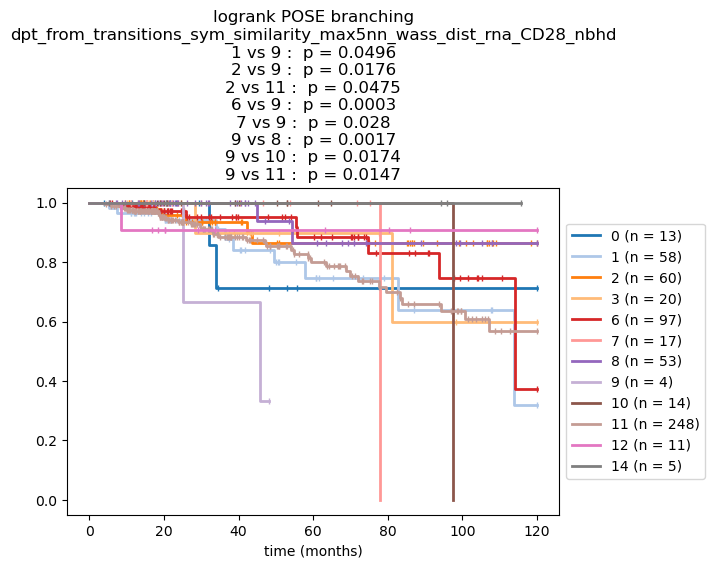

In [36]:
colors = [cm.to_hex(plt.cm.tab10(i)) for i in range(10)] if branch_record.nunique() <=10 else [cm.to_hex(plt.cm.tab20(i)) for i in range(20)]

if branch_record.nunique() <= 20:
    color_cycler = colors
else:
    norm = matplotlib.colors.Normalize(vmin=min(branch_record.unique()), 
                                       vmax=max(branch_record.unique()), clip=True)
    mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.gist_rainbow)
    color_cycler = [mapper.to_rgba(v) for v in sorted(branch_record.unique())]

nfv.KM_between_groups(TEcut['OS_MONTHS'], TEcut['OS_STATUS'], 
                      branch_record, min_group_size=3,
                      figsize=(7, 4), show_censors=True, ci_show=False,
                      show_at_risk_counts=False,
                      ttl=f"POSE branching\n{key}",                      
                      colors=dict(zip(sorted(branch_record.unique()), itertools.cycle(color_cycler))), 
                      xlabel='time (months)', linewidth=2,
                      censor_styles={'ms': 5, 'marker': '|', # 'markeredgecolor': '#ff0000',
                                    },
                      )

### Visualize POSE 

In [37]:
pos = nx.layout.kamada_kawai_layout(G_poser_nn)

First determine features to color nodes by:

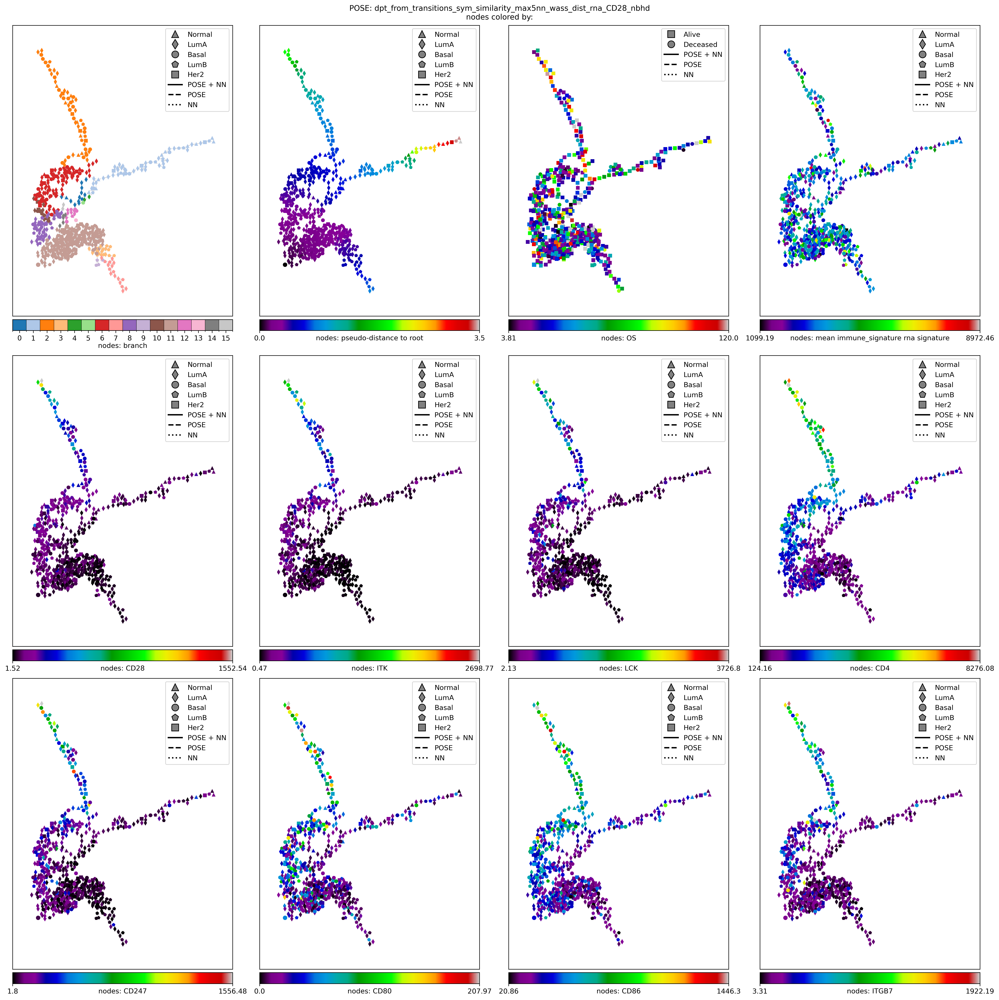

In [38]:
root_obs = poser.root
nodelist = list(G_poser_nn)
edgelist = list(G_poser_nn.edges())
node_labels = {k: G_poser_nn.nodes[k]['name'] for k in nodelist}
edge_style = [G_poser_nn.edges[ee]['edge_origin'] for ee in edgelist]
node_size = [40 if k== root_obs else 30 for k in nodelist]
# node_shape = clin['Dead'].replace({False: 'alive', True: 'deceased'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()
# node_shape_response = clin['Response'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_pam50 = clin['PAM50'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_os = TEcut['OS_STATUS'].replace({1: 'Deceased', 
                                            0: 'Alive'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()

nsm_pam50 = {'Normal': '^', 'LumA': 'd', 'Basal': 'o', 'LumB': 'p', 'Her2': 's'}
nsm_os = {'Alive': 's', 'Deceased': 'o'}

node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
node_colors_record[f'pseudo-distance to root'] = [poser.distances[poser.root, k] for k in nodelist] 
node_colors_record['OS'] = TEcut['OS_MONTHS'].loc[[node_labels[kk] for kk in nodelist]].values.tolist() 
node_colors_record[f"mean {gene_sig_label} rna signature"] = keeper.data['rna'].subset(features=list(set(gene_sig) & set(keeper.graphs['rna']))).mean(axis=0).values.tolist()
# node_colors_record['CD28 rna'] = keeper.data['rna'].subset(features=['CD28']).loc['CD28'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

for gn in ['CD28', 'ITK', 'LCK', 'CD4', 'CD247','CD80','CD86', 'ITGB7']: # ['CD28', 'CD4', 'CCR5', 'CD3G', 'LCP2', 'LCK', 'ITK', 'ITGB7']: # ['CD28', 'GZMB', 'TGFBR2', 'TNF']:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 4, figsize=(20, 20), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);

for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*2 + [node_shape_os] + [node_shape_pam50]*(len(node_colors_record)-3),
                                                           [nsm_pam50]*2 + [nsm_os] + [nsm_pam50]*(len(node_colors_record)-3),
                                                           [True] + [None]*(len(node_colors_record)-1),
                                                           [None]*len(node_colors_record), #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                          )        

In [41]:
print(G_poser_nn)

Graph with 606 nodes and 985 edges


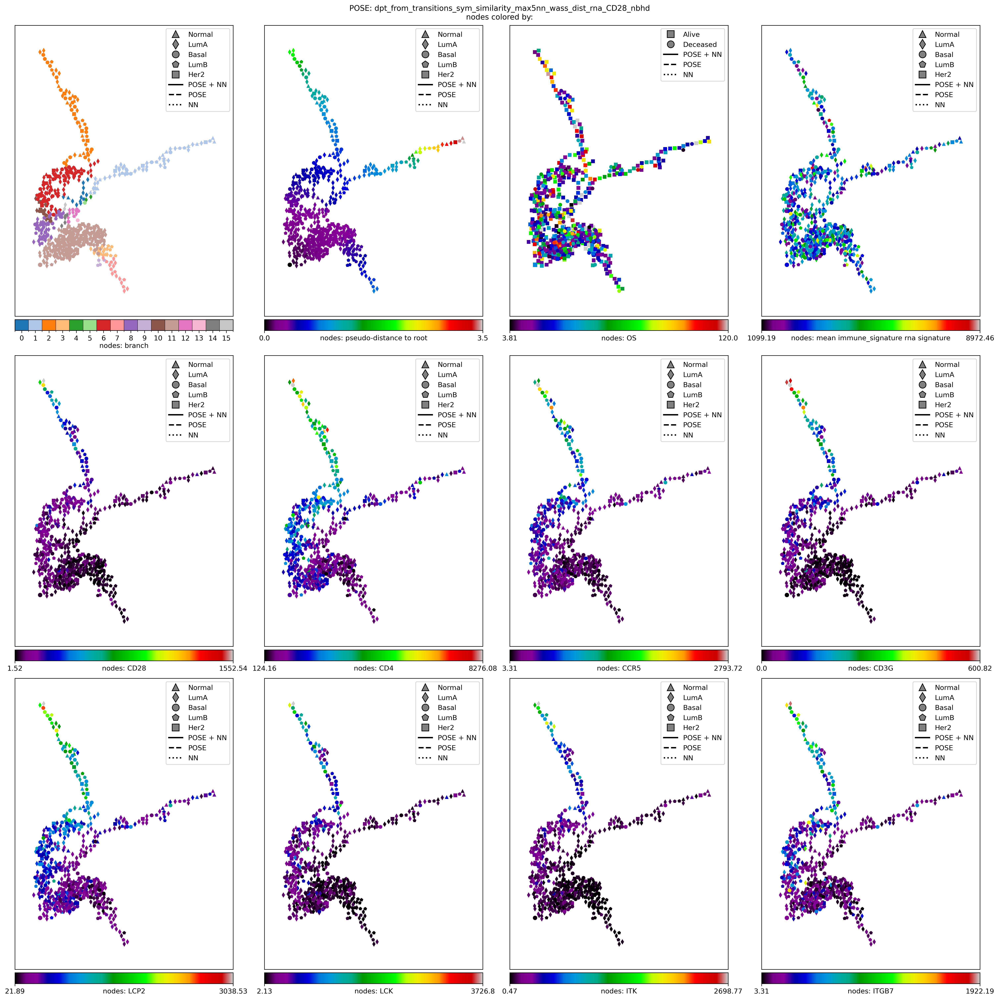

In [42]:
root_obs = poser.root
nodelist = list(G_poser_nn)
edgelist = list(G_poser_nn.edges())
node_labels = {k: G_poser_nn.nodes[k]['name'] for k in nodelist}
edge_style = [G_poser_nn.edges[ee]['edge_origin'] for ee in edgelist]
node_size = [40 if k== root_obs else 30 for k in nodelist]
# node_shape = clin['Dead'].replace({False: 'alive', True: 'deceased'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()
# node_shape_response = clin['Response'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_pam50 = clin['PAM50'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()
node_shape_os = TEcut['OS_STATUS'].replace({1: 'Deceased', 
                                            0: 'Alive'}).loc[[node_labels[kk] for kk in nodelist]].values.tolist()

nsm_pam50 = {'Normal': '^', 'LumA': 'd', 'Basal': 'o', 'LumB': 'p', 'Her2': 's'}
nsm_os = {'Alive': 's', 'Deceased': 'o'}

node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
node_colors_record[f'pseudo-distance to root'] = [poser.distances[poser.root, k] for k in nodelist] 
node_colors_record['OS'] = TEcut['OS_MONTHS'].loc[[node_labels[kk] for kk in nodelist]].values.tolist() 
node_colors_record[f"mean {gene_sig_label} rna signature"] = keeper.data['rna'].subset(features=list(set(gene_sig) & set(keeper.graphs['rna']))).mean(axis=0).values.tolist()
# node_colors_record['CD28 rna'] = keeper.data['rna'].subset(features=['CD28']).loc['CD28'].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

for gn in ['CD28', 'CD4', 'CCR5', 'CD3G', 'LCP2', 'LCK', 'ITK', 'ITGB7']: # ['CD28', 'GZMB', 'TGFBR2', 'TNF']: 
    # ['CD28', 'ITK', 'LCK', 'CD4', 'CD247','CD80','CD86']
    
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 4, figsize=(20, 20), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);

for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*2 + [node_shape_os] + [node_shape_pam50]*(len(node_colors_record)-3),
                                                           [nsm_pam50]*2 + [nsm_os] + [nsm_pam50]*(len(node_colors_record)-3),
                                                           [True] + [None]*(len(node_colors_record)-1),
                                                           [None]*len(node_colors_record), #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                          )        

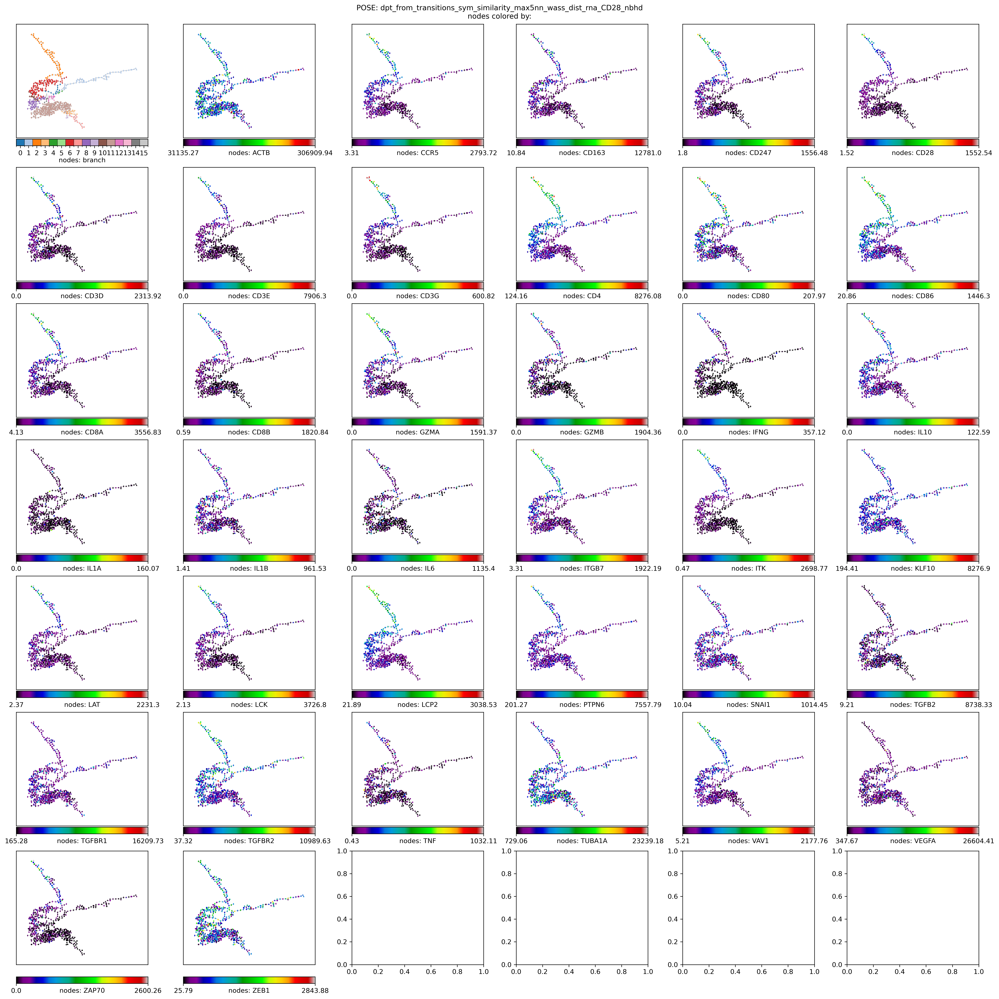

In [43]:
node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
for gn in gene_sig:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(7,6, figsize=(21,21), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);
node_size=5
for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*len(node_colors_record), # 2 + [node_shape_os] + [node_shape_pam50]*6,
                                                           [nsm_pam50]*len(node_colors_record), # *2 + [nsm_os] + [nsm_pam50]*6,
                                                           [True] + [None]*len(node_colors_record), # *8,
                                                           [None]*len(node_colors_record), # *8, #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                           edge_show_legend=False, node_show_legend=False,
                          )

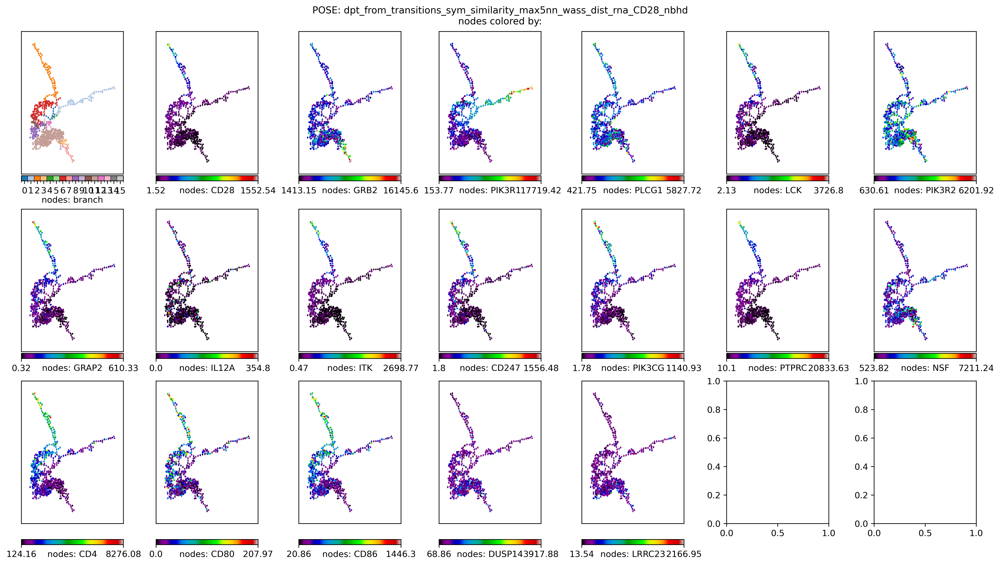

In [44]:
node_colors_record = {}
node_colors_record[f'branch'] = [G_poser_nn.nodes[k]['branch'] for k in nodelist]
for gn in ['CD28'] + list(keeper.graphs['rna'].neighbors('CD28')): # gene_sig:
    node_colors_record[gn] = keeper.data['rna'].subset(features=[gn]).loc[gn].loc[[node_labels[kk] for kk in nodelist]].values.tolist()

fig, axes = plt.subplots(3, 7, figsize=(16,9), # gridspec_kw={'hspace':0.001, 'wspace': 0.02},
                         layout='constrained')
fig.dpi = 300
fontsize = 11 # 42
fig.suptitle(f"POSE: {key}\nnodes colored by:", fontsize=fontsize);
node_size=5
for (ttl, nc), cmap, node_shape, nsm, ncde, ntm, ax in zip(node_colors_record.items(), 
                                                           ['tab10' if branch_record.nunique() <= 10 else 'tab20' if branch_record.nunique() <=20 else 'gist_rainbow'] + ['nipy_spectral']*(len(node_colors_record)-1),
                                                           [node_shape_pam50]*len(node_colors_record), # 2 + [node_shape_os] + [node_shape_pam50]*6,
                                                           [nsm_pam50]*len(node_colors_record), # *2 + [nsm_os] + [nsm_pam50]*6,
                                                           [True] + [None]*len(node_colors_record), # *8,
                                                           [None]*len(node_colors_record), # *8, #  + [{0: 'NIV3-NAIVE', 1: 'NIV3-PROG'}] + [None]*3,
                                                           np.ravel(axes)):
    ax = nfv.plot_topology(G_poser_nn, pos=pos, ax=ax,
                           with_node_labels=False, node_font_size=2, with_edge_labels=False,
                           node_cbar=True,
                           nodelist=nodelist, edgelist=edgelist, node_cmap=cmap,
                           node_size=node_size, node_color=nc, edge_color='lightgray',                   
                           node_shape=node_shape, node_shape_mapper=nsm, 
                           border_linewidths=0., # 0.5, 
                           bordercolors='k', edge_width=1.0, edge_style=edge_style, 
                           edge_style_mapper={'POSE + NN': '-', 'POSE': '--', 'NN': ':'},
                           node_labels=node_labels, edge_labels=None,
                           node_cbar_label=ttl,
                           node_cmap_drawedges=ncde,
                           node_ticklabels_mapper=ntm,
                           edge_show_legend=False, node_show_legend=False,
                          )

# Test interactive plot

In [39]:
import plotly.graph_objects as go
from dash import Dash, html, dcc, Input, Output, State
from jupyter_dash import JupyterDash

# import dash

import dash_cytoscape as cyto
import dash.exceptions as dash_exceptions
import matplotlib.cm as cm
import matplotlib.colors as colors
from dash import callback_context

In [40]:
G = G_poser_nn.copy()
D = poser.distances.copy() # keeper.distances[key].data.copy()

TO DO:
- addd option to hover over a few nodes and output unique features
- check variables for wavy spiral layout
- add layout option to expand and contract the layout

In [48]:
keeper.observation_labels[poser.root]

'TCGA-OL-A5RW-01'

In [41]:
nf.render_pose(keeper, G, key)

TypeError: The `dash_cytoscape.Cytoscape` component (version 0.2.0) with the ID "network-graph" received an unexpected keyword argument: `selectable`
Allowed arguments: autoRefreshLayout, autolock, autoungrabify, autounselectify, boxSelectionEnabled, className, elements, generateImage, id, imageData, layout, maxZoom, minZoom, mouseoverEdgeData, mouseoverNodeData, pan, panningEnabled, responsive, selectedEdgeData, selectedNodeData, style, stylesheet, tapEdge, tapEdgeData, tapNode, tapNodeData, userPanningEnabled, userZoomingEnabled, zoom, zoomingEnabled

In [33]:
# import plotly.tools as tls
import plotly.figure_factory as ff

In [34]:
from matplotlib import colormaps as mpl_cm


In [35]:
positions_records = {}

# Helper function to create a Plotly colorbar figure
def create_colorbar(values, title, color_scale='viridis'):
    values = np.array([[min(values), max(values)]])
    # color_scale = 'viridis'    
    trace = [go.Heatmap(
        z=values, # [[v] for v in sorted(values)],
        colorscale=color_scale,
        showscale=True,
        zmin=values.min(),
        zmax=values.max(),
        colorbar=dict(title=title, titleside='right',
                      ticks='outside', 
                      # tickvals=[0, 0.5, 1], ticktext=['Low', 'Medium', 'High'], 
                      x=0),
    ),
             go.Heatmap(
            z=np.zeros_like(values), # ensure there are enough points to cover the whole image
            colorscale="Picnic_r",  # any colorscale that has white at 0
            showscale=False,
            zmid=0,
        ),
            ]
    fig = go.Figure(data=trace) # , layout=layout)
    fig.update_layout(
        width=100, # 75, # 75 seems to work empirically, you may have to adjust the width
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        xaxis_zeroline=False,
        yaxis_zeroline=False,
        xaxis_visible=False,
        yaxis_visible=False,
        margin=dict(l=0, r=0, b=0, t=0), # zeroing the margins gives a tighter figure, and is also important to make the other numbers work out
    )

    fig.update_traces(hoverinfo='none') # , showscale=True, zmin=values.min(), zmax=values.max())    
    return fig

def get_node_colors(G, node_color_attr, node_cmap='jet'):
    """ get dict with color for each node 
    
    Parameters
    ----------
    G : networkx.Graph
        The pose network.
    node_color_attr : {str, int, numpy array}
        Attribute to prescribe node colors. If a str, the corresponding 
        node attribute in the graph is used. If an int, it is treated as the id of
        an observation and the distance to that observation is used as the node
        colors. If an array, expected to be the same length as the number of nodes
        with the values to be mapped to colors for each node, ordered consecutively by index.
    node_cmap : 
    """    
        
    if isinstance(node_color_attr, int):
        node_colors = D[node_color_attr, list(G.nodes())]
    elif isinstance(node_color_attr, str):
        node_colors = [G.nodes[node][node_color_attr] for node in G.nodes()]
    else: 
        node_colors = node_color_attr[list(G.nodes())]
        
    norm = colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
    cmap = mpl_cm.get_cmap(node_cmap) # cm.get_cmap(node_cmap)
    # if isinstance(node_color_attr, int):
    #     node_color_map = {node: colors.rgb2hex(cmap(norm(D[node_color_attr, node]))) for node in G.nodes()}
    # elif isinstance(node_color_attr, str):
    #     node_color_map = {node: colors.rgb2hex(cmap(norm(G.nodes[node][node_color_attr]))) for node in G.nodes()}            
    # else:
    #     node_color_map = {node: colors.rgb2hex(cmap(norm(node_color_attr[node]))) for node in G.nodes()}
    node_color_map = {node: colors.rgb2hex(cmap(norm(val))) for node, val in zip(G.nodes(), node_colors)}
    cbar = create_colorbar(node_colors, 'nodes', color_scale=node_cmap)
    return node_color_map, cbar

def get_edge_colors(G, edge_color_attr, edge_cmap='jet'):
    """ get dict with color for each edge """
    edge_colors = [G.edges[edge][edge_color_attr] for edge in G.edges()]
    norm = colors.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
    cmap = mpl_cm.get_cmap(edge_cmap) # cm.get_cmap(edge_cmap)
    edge_color_map = {edge: colors.rgb2hex(cmap(norm(G.edges[edge][edge_color_attr]))) for edge in G.edges()}
    cbar = create_colorbar(edge_colors, 'edges', color_scale=edge_cmap)
    return edge_color_map, cbar

def nx_to_cytoscape(G, # node_size, 
                    # edge_width, 
                    pos=None,
                    node_color_attr=None, node_cmap='jet',
                    edge_color_attr=None, edge_cmap='jet', return_cbar=False): 

    elements = {'nodes': nx.cytoscape_data(G)['elements']['nodes'], 'edges': nx.cytoscape_data(G)['elements']['edges']}
    
    # elements = []

    # nodes       
    if node_color_attr is not None:
        # node_colors = [G.nodes[node][node_color_attr] for node in G.nodes()]
        # norm = colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
        # cmap = cm.get_cmap(node_cmap)
        # node_color_map = {node: colors.rgb2hex(cmap(norm(G.nodes[node][node_color_attr]))) for node in G.nodes()}        
        node_color_map, node_cbar_vis = get_node_colors(G, node_color_attr, node_cmap=node_cmap)
        
        if isinstance(node_color_attr, str):
            label = node_color_attr
        elif isinstance(node_color_attr, int):
            label = f"pseudo-distance from {G.nodes[node_color_attr]['name']}"
        else:
            label = "feature"            
        # label = node_color_attr if isinstance(node_color_attr, str) else f"pseudo-distance from {G.nodes[node_color_attr]['name']}"        
    else:
        node_color_map = {node: '#888' for node in G.nodes()}  # Default color                                           
        node_cbar_vis = None
        
    #     for node in G.nodes():
    #         node_elements = {
    #             'data': {'id': str(node), 'label': G.nodes[node]['name'], 
    #                      'size': node_size, 
    #                      **G.nodes[node]},
    #             'style': {'background-color': node_color_map[node], # 'color': node_color_map[node],
    #                      },
    #             'classes': 'node'
    #         }

    #         if pos is None:
    #             pos = nx.kamada_kawai_layout(G)
    #         # if pos is not None:
    #         node_elements['position'] = dict(zip(['x', 'y'], pos[node]))
    #         elements.append(node_elements)
    if pos is None:
        if 'kamada_kawai' in positions_records:
            pos = positions_records['kamada_kawai']
        else:                                    
            pos = nx.kamada_kawai_layout(G)
            # positions_records['kamada_kawai'] = pos
            
        # bounding_box=(0., 0., 400, 450)
        bounding_box=(3., 3., 400, 430)
        X_MIN, Y_MIN, X_MAX, Y_MAX = bounding_box
        x = [k[0] for k in pos.values()]
        y = [k[1] for k in pos.values()]
        x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)

        # print(f"*** set pos ***")
        # pos = {node: {'x': (position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
        #               'y': (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
        #               } for node, position in pos.items()}
        pos = {node: np.array([(position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
                               (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
                              ]) for node, position in pos.items()}

            
    for vv in elements['nodes']:
        vv['data']['color'] = node_color_map[int(vv['data']['id'])]
        # vv['data']['size'] = node_size
        vv['position'] = dict(zip(['x', 'y'], pos[int(vv['data']['id'])]))
        # vv['group'] = 'nodes'
        # vv['classes'] = 'nodes'
        
        
    # edges 
    if edge_color_attr:
        # edge_colors = [G.edges[edge][edge_color_attr] for edge in G.edges()]
        # norm = colors.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
        # cmap = cm.get_cmap(edge_cmap)
        # edge_color_map = {edge: colors.rgb2hex(cmap(norm(G.edges[edge][edge_color_attr]))) for edge in G.edges()}
        edge_color_map, edge_cbar_vis = get_edge_colors(G, edge_color_attr, edge_cmap=edge_cmap)
    else:
        edge_color_map = {edge: '#222' for edge in G.edges()}  # Default color
        edge_cbar_vis = None
        
    # for edge in G.edges():
    #     elements.append({
    #         'data': {'source': str(edge[0]), 'target': str(edge[1]), 
    #                  'width': edge_width, **G.edges[edge]},
    #         'style': {'line-color': edge_color_map[edge]},
    #         'classes': 'edge'
    #     })
    for ee in elements['edges']:
        edg = (ee['data']['source'], ee['data']['target'])
        # ee['group'] = 'edges'
        # ee['classes'] = 'edges'
        ee['data']['color'] = edge_color_map[edg]
        # ee['data']['width'] = edge_width
        
    # print(f"returning node_cbar_vis = {node_cbar_vis}") 
    if return_cbar:
        return elements, node_cbar_vis, edge_cbar_vis
    else:
        return elements

In [36]:
# import plotly.express as px

In [37]:
# color_scale = px.colors.sequential.Viridis

In [38]:
# positions_records = {}
# def get_node_colors(G, node_color_attr, node_cmap='jet'):
#     """ get dict with color for each node 
    
#     Parameters
#     ----------
#     node_color_attr : {str, int}
#         Attribute to prescribe node colors. If a str, the corresponding 
#         node attribute in the graph is used. If an int, it is treated as the id of
#         an observation and the distance to that observation is used as the node
#         colors. 
#     """
#     if isinstance(node_color_attr, int):
#         node_colors = D[node_color_attr, list(G.nodes())]
#     else:
#         node_colors = [G.nodes[node][node_color_attr] for node in G.nodes()]
#     norm = colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
#     cmap = cm.get_cmap(node_cmap)
#     if isinstance(node_color_attr, int):
#         node_color_map = {node: colors.rgb2hex(cmap(norm(D[node_color_attr, node]))) for node in G.nodes()}
#     else:
#         node_color_map = {node: colors.rgb2hex(cmap(norm(G.nodes[node][node_color_attr]))) for node in G.nodes()}            
        
#     label = node_color_attr if isinstance(node_color_attr, str) else f"pseudo-distance from {G.nodes[int(node_color_attr)]['name']}"
#     #     colorbar_fig = go.Figure() # layout=dict(plot_bgcolor='white')
#     #     colorbar_fig.add_trace(go.Scatter(
#     #         x=[None],
#     #         y=[None],
#     #         mode='markers',
#     #         marker=dict(        
#     #             size=0,
#     #             colorscale='viridis',
#     #             cmin=min(node_colors), # 0,
#     #             cmax=max(node_colors), # 100,
#     #             colorbar=dict(
#     #             title=f"nodes: {label}" ,
#     #             thickness=15,
#     #             len=0.5,
#     #             x=0.3, # 0.5,
#     #             y=0.5, # 0.5,
#     #             xanchor='left',
#     #             # xanchor='center',
#     #             # yanchor='top',
#     #             # orientation='h',
#     #             ),
#     #         ),
#     #         showlegend=False,
#     #         hoverinfo='none'
#     #     ))

#     #     colorbar_fig.update_layout(
#     #         margin=dict(l=0, r=0, t=0, b=0),
#     #         # height=100,
#     #         # width=300,
#     #         height=110, # 40, # 80, # 40, # 200, # 110,
#     #         width=60,# 200, # 120, # 60,
#     #         xaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
#     #         yaxis=dict(showticklabels=False, showgrid=False, zeroline=False)
#     #     )

#     #     colorbar_figure_html = dcc.Graph(figure=colorbar_fig, config={'displayModeBar': False})
#     colorbar_figure_html = dcc.Graph(
#         # id='node_colorbar_fig',
#         figure=px.imshow([[0, 1]], color_continuous_scale=color_scale, 
#                          aspect='auto').update_layout(
#             coloraxis_showscale=True, 
#             coloraxis_colorbar=dict(
#                 title='Score', 
#                 ticks="outside",
#                 tickvals=[0, 0.5, 1],
#                 ticktext=['Low', 'Medium', 'High']
#             ),
#             margin=dict(t=20, b=20, l=80, r=20),
#         ).update_xaxes(visible=False).update_yaxes(visible=False).update_traces(hoverinfo='none', showscale=True, zmin=0, zmax=1),
#         config={'displayModeBar': False}  # Hides the Plotly mode bar
#     )
#     return node_color_map, colorbar_figure_html

# # Generate the color bar with Matplotlib
# # def create_colorbar_fig(colormap, label):
# #     fig, ax = plt.subplots(figsize=(6, 1))
# #     fig.subplots_adjust(bottom=0.5)

# #     norm = mcolors.Normalize(vmin=0, vmax=100)
# #     fig.colorbar(mcolors.ScalarMappable(norm=norm, 
# #                                         # cmap=colormap,
# #                                         cmap=plt.cm.viridis,
# #                                        ), 
# #                  cax=ax, orientation='horizontal', label=label)
        
    
# #     plotly_fig = tls.mpl_to_plotly(fig)
# #     plotly_fig.update_layout(
# #         autosize=False,
# #         margin=dict(l=0, r=0, t=0, b=0)
# #     )

# #     cbar_graph = dcc.Graph(figure=plotly_fig, style={'width': '300px', 'height': '50px'})
    
# #     return cbar_graph

# def get_edge_colors(G, edge_color_attr, edge_cmap='jet'):
#     """ get dict with color for each edge """
#     edge_colors = [G.edges[edge][edge_color_attr] for edge in G.edges()]
#     norm = colors.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
#     cmap = cm.get_cmap(edge_cmap)
#     edge_color_map = {edge: colors.rgb2hex(cmap(norm(G.edges[edge][edge_color_attr]))) for edge in G.edges()}
#     return edge_color_map

# def nx_to_cytoscape(G, # node_size, 
#                     # edge_width, 
#                     pos=None,
#                     node_color_attr=None, node_cmap='jet',
#                     edge_color_attr=None, edge_cmap='jet', return_node_colorbar=True): 

#     elements = {'nodes': nx.cytoscape_data(G)['elements']['nodes'], 'edges': nx.cytoscape_data(G)['elements']['edges']}
    
#     # elements = []

#     # nodes       
#     if node_color_attr: # should not work when node_color_attr is ''
#         # node_colors = [G.nodes[node][node_color_attr] for node in G.nodes()]
#         # norm = colors.Normalize(vmin=min(node_colors), vmax=max(node_colors))
#         # cmap = cm.get_cmap(node_cmap)
#         # node_color_map = {node: colors.rgb2hex(cmap(norm(G.nodes[node][node_color_attr]))) for node in G.nodes()}
#         node_color_map, colorbar_figure_html = get_node_colors(G, node_color_attr, node_cmap=node_cmap)
        
#         # label = node_color_attr if isinstance(node_color_attr, str) else f"pseudo-distance from {G.nodes[node_color_attr]['name']}"
#         # plotly_node_cbar = [create_colorbar_fig(node_cmap, f"nodes: {label}")]
        
        
#     else:
#         node_color_map = {node: '#888' for node in G.nodes()}  # Default color                                    
#         # plotly_node_cbar = []
#         colorbar_figure_html = html.Pre()
        
#     #     for node in G.nodes():
#     #         node_elements = {
#     #             'data': {'id': str(node), 'label': G.nodes[node]['name'], 
#     #                      'size': node_size, 
#     #                      **G.nodes[node]},
#     #             'style': {'background-color': node_color_map[node], # 'color': node_color_map[node],
#     #                      },
#     #             'classes': 'node'
#     #         }

#     #         if pos is None:
#     #             pos = nx.kamada_kawai_layout(G)
#     #         # if pos is not None:
#     #         node_elements['position'] = dict(zip(['x', 'y'], pos[node]))
#     #         elements.append(node_elements)
#     if pos is None:
#         if 'kamada_kawai' in positions_records:
#             pos = positions_records['kamada_kawai']
#         else:                                    
#             pos = nx.kamada_kawai_layout(G)
#             # positions_records['kamada_kawai'] = pos
            
#         # bounding_box=(0., 0., 400, 450)
#         bounding_box=(3., 3., 400, 430)
#         X_MIN, Y_MIN, X_MAX, Y_MAX = bounding_box
#         x = [k[0] for k in pos.values()]
#         y = [k[1] for k in pos.values()]
#         x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)

#         # print(f"*** set pos ***")
#         # pos = {node: {'x': (position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#         #               'y': (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#         #               } for node, position in pos.items()}
#         pos = {node: np.array([(position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#                                (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#                               ]) for node, position in pos.items()}

            
#     for vv in elements['nodes']:
#         vv['data']['color'] = node_color_map[int(vv['data']['id'])]
#         # vv['data']['size'] = node_size
#         vv['position'] = dict(zip(['x', 'y'], pos[int(vv['data']['id'])]))
#         vv['group'] = 'nodes'
#         vv['classes'] = 'nodes'
        
        
#     # edges 
#     if edge_color_attr:
#         # edge_colors = [G.edges[edge][edge_color_attr] for edge in G.edges()]
#         # norm = colors.Normalize(vmin=min(edge_colors), vmax=max(edge_colors))
#         # cmap = cm.get_cmap(edge_cmap)
#         # edge_color_map = {edge: colors.rgb2hex(cmap(norm(G.edges[edge][edge_color_attr]))) for edge in G.edges()}
#         edge_color_map = get_edge_colors(G, edge_color_attr, edge_cmap=edge_cmap)
#     else:
#         edge_color_map = {edge: '#222' for edge in G.edges()}  # Default color
        
#     # for edge in G.edges():
#     #     elements.append({
#     #         'data': {'source': str(edge[0]), 'target': str(edge[1]), 
#     #                  'width': edge_width, **G.edges[edge]},
#     #         'style': {'line-color': edge_color_map[edge]},
#     #         'classes': 'edge'
#     #     })
#     for ee in elements['edges']:
#         edg = (ee['data']['source'], ee['data']['target'])
#         ee['group'] = 'edges'
#         ee['classes'] = 'edges'
#         ee['data']['color'] = edge_color_map[edg]
#         # ee['data']['width'] = edge_width
        
#     if return_node_colorbar:
#         return elements, colorbar_figure_html # , plotly_node_cbar
    
#     return elements

In [39]:
# # LATEST WORKING COPY
# # Initialize the Dash app
# external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

# # app = JupyterDash(__name__, external_stylesheets=external_stylesheets)
# app = JupyterDash(__name__)

# styles = {
#     'container': {
#         'position': 'fixed',
#         'display': 'flex',
#         'flex-direction': 'row',
#         'height': '98%',
#         'width': '100%',
#         # @ 'padding': 
#         'gap': '10px',
#         # 'margin': '10px',
        
#     },    
#     # 'control-panel-container': {
#     #     'width': '20%', 
#     #     'display': 'inline-block', 
#     #     'verticalAlign': 'top', 
#     #     'overflow-y': 'scroll', 
#     #     'border': '1px solid black', 
#     #     'border-radius': '20px', 
#     #     'padding': '5px',
#     #     'margin': '3px',
#     #     # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
#     #     # 'flex': '0.2',
#     #     # 'position': 'relative',
#     #     # 'position': 'relative', 'flex': '1',
#     # },  
#     'control-panel-container': {
#         'width': '20%', 
#         # 'flex': '0.20',
#         'display': 'inline-block', 
#         'verticalAlign': 'top', 
#         # 'overflow-y': 'scroll', 
#         'border': '1px solid black', 
#         'border-radius': '20px', 
#         'padding': '5px',
#         'margin': '3px',
#         # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
#         # 'flex': '0.2',
#         # 'position': 'relative',
#         # 'position': 'relative', 'flex': '1',
#     },
#     'control-panel' : {
#         'display': 'inline-block',
#         # 'position': 'absolute',
#         # 'position': 'relative',
#         'overflow-y': 'scroll', 
#         # 'width': '98%',
#         'height': '81%',
#         'paddingRight': '15px',
#         'paddingLeft': '8px',
#         'paddingBottom': '3px',
#         'border': 'thin solid lightgrey',
#         'border-radius': '10px',
#         'z-index': 999,
#     },
#     'cy-container': {
#         'flex': '0.78',
#         'position': 'relative',
#         # 'paddingLeft': '20px',
#         'border': '1px solid black',
#         'border-radius': '20px',
#         # 'padding': '10px',
#     },
#     'cytoscape': {
#         'position': 'absolute',
#         'width': '98%',
#         'height': '80%', # '83%', # '100%',
#         # 'padding': '3px',
#        #  'margin': '15px',
#         'z-index': 999
#     },
#     'pre': {
#         'border': 'thin lightgrey solid',
#         'border-radius': '20px',
#         'overflowX': 'scroll',
#         'overflowY': 'scroll',
#         'width': '280px', # '100%',
#         'height': '15%',
#         'padding': '10px',
#         # 'align': 'right',
#         'margin': '5px',
#         #  'position': 'fixed', # 'relative',
#     }
# }



# # Define the layout of the app
# app.layout = html.Div(style=styles['container'], 
#                       children=[
#                           html.Div(className='control-panel-container', style=styles['control-panel-container'], children=[
#                               html.H2("NetFlow POSE"),
#                               html.H3("Settings"),
#                           html.Div([
#                               dcc.Store(id='container-dimensions'), ###
#                               # html.H2("NetFlow POSE"),
#                               html.H4("Graph Layout"),
#                               dcc.Dropdown(
#                                   id='layout-dropdown',
#                                   options=[{'label': layout, 'value': layout} for layout in ['kamada_kawai', 'spring', 
#                                                                                              'circular', # 'cose', 
#                                                                                              'shell', 'grid', 
#                                                                                              'breadthfirst', 'sin',
#                                                                                              'wavy_spiral']],
#                                   value='kamada_kawai', # 'cose', # 
#                               ),
#                               html.H4("Highlight Node by Label"),
#                               dcc.Input(id='node-label', type='text', value=''),
#                               html.Button('Highlight Node', id='highlight-button', n_clicks=0),                              
#                               html.H4("Node Size"),
#                               dcc.Slider(id='node-size-slider', min=0.01, max=30, step=0.01, value=8, 
#                                          marks={1: 'smaller', 30: 'larger'}),
#                               html.H4("Node Attribute for Coloring"),
#                               dcc.Dropdown(
#                                   id='node-attribute-dropdown',
#                                   options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
#                                   value='None', # 'branch'
#                               ),       
#                               html.H4("Data Feature for Coloring Nodes"),
#                               dcc.Dropdown(
#                                   id='keeper-data-dropdown',
#                                   options=[{'label': 'None', 'value': 'None'}] + [{'label': dataset.label, 'value': dataset.label} for dataset in keeper.data],
#                                   value='None', # 'branch'
#                               ),  
#                               dcc.Input(id='feature-label', type='text', value=''),
#                               html.Button('Color Nodes', id='node-color-button', n_clicks=0),                              
                              
#                               html.H4("Colormap for Nodes"),
#                               dcc.Dropdown(
#                                   id='node-colormap-dropdown',
#                                   options=[{'label': cmap, 'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 'jet', 'nipy_spectral', 'gist_ncar']],
#                                   value='YlGnBu'
#                               ),
#                               html.H4("Edge Width"),
#                               dcc.Slider(id='edge-width-slider', min=0.001, max=14, step=0.001, value=1.5,
#                                          marks={1: 'thinner', 14: 'wider'}),
#                               html.H4("Edge Attribute for Coloring"),
#                               dcc.Dropdown(
#                                   id='edge-attribute-dropdown',
#                                   options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in list(G.edges(data=True))[0][-1].keys()],
#                                   value='None', # 'distance'
#                               ),                              
#                               html.H4("Colormap for Edges"),
#                               dcc.Dropdown(
#                                   id='edge-colormap-dropdown',
#                                   options=[{'label': cmap, 'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 'jet', 'nipy_spectral', 'gist_ncar']],
#                                   value='nipy_spectral'
#                               ),
#                               dcc.Interval(id='interval', interval=1000, n_intervals=0)  # Interval to capture dimensions periodically                              
#                           ], 
#                               style=styles['control-panel'], # styles['control-panel-container'],
#                           ),
#                           ]),
                          
#                           html.Div(className='cy-container', style=styles['cy-container'], children=[   
#                               html.Pre(id='cytoscape-mouseoverNodeData', style=styles['pre']), 
#                               cyto.Cytoscape(
#                                   id='network-graph',
#                                   elements=nx_to_cytoscape(G), # , 30, 1),        
#                                   # style={'width': '80%', 'height': '800px'},
#                                   style=styles['cytoscape'],
#                                   # layout={'name': 'kamada_kawai'}, # 'cose'},
#                                   layout={'name': 'preset', "fit": False},
#                                   # layout={'name': 'cose'},
#                                   zoom=1,  # Initial zoom level
#                                   pan={'x': 0, 'y': 0},  # Initial pan position
#                                   stylesheet=[
#                                       {
#                                           'selector': 'node',
#                                           'style': {
#                                               # 'label': '', # 'data(name)',
#                                               'content': '',
#                                               'font-size': '8px',
#                                               'width': 8, # 'data(size)',
#                                               'height': 8, # 'data(size)',
#                                               'background-color': '#888', # 'tan', # 'data(color)',                    
#                                               # 'background-color': 'style(background-color)',
#                                               'text-opacity': 0.,  # Hide labels by default,                    
#                                           },
#                                           # 'z-index': 1001,
#                                       },
#                                       # {
#                                       #     'selector': 'node:hover',                                          
#                                       #     'style': {
#                                       #         # 'label': 'data(name)',
#                                       #         'content': 'data(name)',
#                                       #         'font-size': '8px',
#                                       #         'text-opacity': 1.,  # Show labels on hover
#                                       #     },
#                                       #     # 'z-index': 1005,
#                                       # },
#                                       {
#                                           'selector': 'edge',
#                                           'style': {
#                                               'width': 1, # 'data(width)',
#                                               'line-color': '#222', # 'darkgray', # 'data(color)'
#                                               # 'line-color': 'style(line-color)'
#                                           }
#                                       },
#                                       # Class selectors
#                                       {
#                                           'selector': '.highlight',
#                                           'style': {
#                                               'border-width': 20,
#                                               'border-color': 'black',
#                                               # 'outline-width': 20,
#                                               # 'outline-color': 'black',                    
#                                           },
#                                           # 'z-index': 1100,
#                                       },
#                                   ],       
#                                   # responsive=True,
#                               ),
#                           ]),
                          
#                       ])



# app.clientside_callback(
#     '''
#     function(n_intervals) {
#         const container = document.getElementById('network-graph');
#         const dimensions = {width: container.offsetWidth, height: container.offsetHeight};
#         return dimensions;
#     }
#     ''',
#     Output('container-dimensions', 'data'),
#     Input('interval', 'n_intervals')
# )

# @app.callback(
#     Output('network-graph', 'elements'),
#     Output('network-graph', 'stylesheet'),
#     Output('node-attribute-dropdown', 'value'),
#     Output('network-graph', 'zoom'),
#     Output('network-graph', 'pan'),
#     # Output('network-graph', 'layout'),
#     Input('layout-dropdown', 'value'), ###
#     Input('highlight-button', 'n_clicks'), # 
#     State('node-label', 'value'), # 
#     Input('node-size-slider', 'value'), # 
#     Input('edge-width-slider', 'value'), # 
#     Input('node-attribute-dropdown', 'value'), ###
#     Input('edge-attribute-dropdown', 'value'), ###
#     Input('node-colormap-dropdown', 'value'), ###
#     Input('edge-colormap-dropdown', 'value'),
#     Input('network-graph', 'tapNodeData'),
#     State('network-graph', 'elements'),
#     State('container-dimensions', 'data'),
#     State('network-graph', 'zoom'),
#     State('network-graph', 'pan'),
#     Input('node-color-button', 'n_clicks'),
#     Input('feature-label', 'value'),
#     Input('keeper-data-dropdown', 'value'),

#     # prevent_initial_call=True ###
# )
# def update_graph(layout, n_clicks, node_label, 
#                  node_size, 
#                  edge_width, 
#                  node_attr, edge_attr, node_cmap, edge_cmap, 
#                  tap_node_data,
#                  elements_in, dimensions,
#                  current_zoom, current_pan, feature_n_clicks, ft_label, data_label):
    
#     # Determine which input triggered the callback
#     triggered_input = callback_context.triggered[0]['prop_id'].split('.')[0]
    
#     if not dimensions:
#         raise dash_exceptions.PreventUpdate
#     width, height = dimensions['width'], dimensions['height']
    
    
#     # print(f"width = {width}, height = {height}")
#     # Get positions based on layout
    
#     # print(f"*** LAYOUT = {layout}***")
#     # print(f"*** positions of elements in : {int(elements_in['nodes'][0]['data']['id'])}: {elements_in['nodes'][0]} ***")
#     #  print(f"*** is layout in positions_records: 
#     if layout in positions_records.keys():
#         pos = positions_records[layout]
#     else:
#         if layout == 'spring':
#             pos = nx.spring_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'circular':
#             pos = nx.circular_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'kamada_kawai':
#             pos = nx.kamada_kawai_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'shell':        
#             pos = nx.shell_layout(G)  
#             positions_records[layout] = pos
#         elif layout == 'grid':
#             pos = nx.planar_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'sin':
#             pos = nfv.sin_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'wavy_spiral':
#             pos = nfv.wavy_curve_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'cose':
#             pos = None
#         else:
#             warnings.warn("Layout not recognized, using 'kamada_kawai' instead.")
#             pos = nx.kamada_kawai_layout(G)          
        
#     if pos is not None:
#         # bounding_box=(0., 0., 1400, 650)
#         # bounding_box=(0., 0., width, height)
#         bounding_box=(3., 3., width-3., height-3.)
#         X_MIN, Y_MIN, X_MAX, Y_MAX = bounding_box
#         x = [k[0] for k in pos.values()]
#         y = [k[1] for k in pos.values()]
#         x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)

#         # print(f"*** set pos ***")
#         # pos = {node: {'x': (position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#         #               'y': (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#         #               } for node, position in pos.items()}
#         pos = {node: np.array([(position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#                                (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#                               ]) for node, position in pos.items()}
        
#     if triggered_input == 'network-graph': # tap_node_data:
#         node_attr = int(tap_node_data['id'])
#         node_attr_value = 'None'
#     else:
#         node_attr_value = node_attr # node_attr_state # node_attr
#     elements = nx_to_cytoscape(G, # node_size, edge_width, 
#                                pos=pos,
#                                node_color_attr=None if node_attr=='None' else node_attr, 
#                                node_cmap=node_cmap,
#                                edge_color_attr=None if edge_attr=='None' else edge_attr, 
#                                edge_cmap=edge_cmap)

#     # print(f"*** positions of elements after : {int(elements['nodes'][0]['data']['id'])}: {elements['nodes'][0]} ***")
#     if (pos is None) and (layout not in positions_records):
#         positions_records[layout] = {int(k['data']['id']): np.array([k['position']['x'], k['position']['y']]) for k in elements['nodes']}
#         print("*** updated position records ***")
                    
#     # Highlight node by label                       
#     if node_label:
#         for element in elements['nodes']:
#             if element['data'].get('name') == node_label:
#                 element['classes'] += ' highlight'
#                 break    
    
#     # for element in elements:
#     #     if 'node' in element['classes']:
#     #         element['data']['size'] = node_size
#     #     if 'edge' in element['classes']:
#     #         element['data']['width'] = edge_width

#     # # Color nodes by attribute
#     # if node_attr:
#     #     color_nodes = {node: G.nodes[node][node_attr] for node in G.nodes()}
#     # else:
#     #     color_nodes = None
    
    
#     stylesheet=[        
#             {
#                 'selector': 'node',
#                 'style': {
#                     # 'label': 'data(label)',
#                     # 'label': 'data(name)',
#                     # 'label': '',
#                     'content': '', # 'data(label)',
#                     'width': node_size, # 'data(size)',
#                     'height': node_size, # 'data(size)',
#                     'background-color': 'data(color)',
#                     # 'background-color': 'style(background-color)',
#                     'text-opacity': '0',  # Hide labels by default,   
#                     'font-size': '8px',
#                     # 'z-index': 1001,
#                 },
#                 # 'z-index': 1001,
#             },
#             # {
#             #     'selector': 'node:hover',
#             #     'style': {
#             #         # 'label': 'data(name)',
#             #         'content': 'data(name)',
#             #         'text-opacity': '1',  # Show labels on hover
#             #         'font-size': '8px',
#             #     }
#             # },
#             {
#                 'selector': 'edge',
#                 'style': {
#                     'width': edge_width, # 'data(width)',
#                     'line-color': 'data(color)'
#                     # 'line-color': 'style(line-color)'
#                 },
#                 # 'z-index': 1005,
#             },
#             # Class selectors
#             {
#                 'selector': '.highlight',
#                 'style': {
#                     'border-width': 20,
#                     'border-color': 'k',
#                     # 'outline-width': 20,
#                     # 'outline-color': 'black',                   
#                 },
#                 # 'z-index': 1100,
#             },
#         ]    
            
#     layout = {'name': 'preset'},
#     return elements, stylesheet, node_attr_value, current_zoom, current_pan # , layout

# # @app.callback(Output('cytoscape-tapNodeData', 'children'),
# #               Input('network-graph', 'tapNodeData'))
# # def displayTapNodeData(data):
# #     return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 

# @app.callback(Output('cytoscape-mouseoverNodeData', 'children'),
#               Input('network-graph', 'mouseoverNodeData'))
# def displayHoverNodeData(data):
#     # return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 
#     if data is None:
#         return "Hover node data"
#     return "\n".join([f"{k}: {data[k] if not k.startswith('pse') else np.round(data[k], 3)}" for k in ['name', 
#                                                                                                        'id', 'is_root', 
#                                                                                                        'undecided', 
#                                                                                                        'unidentified',
#                                                                                                        'pseudo-distance from root',
#                                                                                                       ]])



In [40]:
# # ORIGINAL WORKING COPY - USE THIS!

# # Initialize the Dash app
# external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

# # app = JupyterDash(__name__, external_stylesheets=external_stylesheets)
# app = JupyterDash(__name__)

# styles = {
#     'container': {
#         'position': 'fixed',
#         'display': 'flex',
#         'flex-direction': 'row',
#         'height': '98%',
#         'width': '100%',
#         # @ 'padding': 
#         'gap': '10px',
#         # 'margin': '10px',
        
#     },    
#     # 'control-panel-container': {
#     #     'width': '20%', 
#     #     'display': 'inline-block', 
#     #     'verticalAlign': 'top', 
#     #     'overflow-y': 'scroll', 
#     #     'border': '1px solid black', 
#     #     'border-radius': '20px', 
#     #     'padding': '5px',
#     #     'margin': '3px',
#     #     # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
#     #     # 'flex': '0.2',
#     #     # 'position': 'relative',
#     #     # 'position': 'relative', 'flex': '1',
#     # },  
#     'control-panel-container': {
#         'width': '20%', 
#         # 'flex': '0.20',
#         'display': 'inline-block', 
#         'verticalAlign': 'top', 
#         # 'overflow-y': 'scroll', 
#         'border': '1px solid black', 
#         'border-radius': '20px', 
#         'padding': '5px',
#         'margin': '3px',
#         # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
#         # 'flex': '0.2',
#         # 'position': 'relative',
#         # 'position': 'relative', 'flex': '1',
#     },
#     'control-panel' : {
#         'display': 'inline-block',
#         # 'position': 'absolute',
#         # 'position': 'relative',
#         'overflow-y': 'scroll', 
#         # 'width': '98%',
#         'height': '81%',
#         'paddingRight': '15px',
#         'paddingLeft': '8px',
#         'paddingBottom': '3px',
#         'border': 'thin solid lightgrey',
#         'border-radius': '10px',
#         'z-index': 999,
#     },
#     'cy-container': {
#         'flex': '0.78',
#         'position': 'relative',
#         # 'paddingLeft': '20px',
#         'border': '1px solid black',
#         'border-radius': '20px',
#         # 'padding': '10px',        
#     },
#     'cytoscape': {
#         'position': 'absolute',
#         'width': '100%', # '98%',
#         'height': '80%', # '83%', # '100%',
#         # 'padding': '3px',
#        #  'margin': '15px',
#         'z-index': 999
#     },
#     'pre': {
#         'border': 'thin lightgrey solid',
#         'border-radius': '20px',
#         'overflowX': 'scroll',
#         'overflowY': 'scroll',
#         'width': '280px', # '100%', 
#         'height': '15%',
#         'padding': '10px',
#         # 'align': 'right',
#         'margin': '5px',
#         #  'position': 'fixed', # 'relative',
#     }
# }



# # Define the layout of the app
# app.layout = html.Div(style=styles['container'], 
#                       children=[
#                           html.Div(className='control-panel-container', 
#                                    style=styles['control-panel-container'], children=[
#                                        html.H2("NetFlow POSE"),
#                                        html.H3("Settings"),
#                                        html.Div([
#                                            dcc.Store(id='container-dimensions'), ###
#                                            # html.H2("NetFlow POSE"),
#                                            html.H4("Graph Layout"),
#                                            dcc.Dropdown(
#                                                id='layout-dropdown',
#                                                options=[{'label': layout, 'value': layout} for layout in ['kamada_kawai', 'spring', 
#                                                                                                           'circular', # 'cose', 
#                                                                                                           'shell', 'grid', 
#                                                                                                           'breadthfirst', 'sin',
#                                                                                                           'wavy_spiral']],
#                                                value='kamada_kawai', # 'cose', # 
#                                            ),
#                                            html.H4("Highlight Node by Label"),
#                                            dcc.Input(id='node-label', type='text', value=''),
#                                            html.Button('Highlight Node', id='highlight-button', n_clicks=0),                              
#                                            html.H4("Node Size"),
#                                            dcc.Slider(id='node-size-slider', min=0.01, max=30, step=0.01, value=8, 
#                                                       marks={1: 'smaller', 30: 'larger'}),
#                                            # 
#                                            # html.H4("Set node colors"),
#                                            # dcc.Dropdown(
#                                            #     id='node-color-type-dropdown',
#                                            #     options=[{'label': 'Node attribute', 'value': 'node_attribute'}, 
#                                            #              {'label': 'Data feature', 'value': 'data_feature'}],
#                                            #     value=0, # 'branch'
#                                            # ),   
#                                            # html.Div(id='additional-controls', children=[
#                                            html.H4("Node Attribute for Coloring"),
#                                            dcc.Dropdown(
#                                                id='node-attribute-dropdown',
#                                                options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
#                                                value='None', # 'branch'
#                                            ),  
#                                            # ]),
#                                            # OR 
#                                            html.H4("Data Feature for Coloring Nodes"),
#                                            dcc.Dropdown(
#                                                id='keeper-data-dropdown',
#                                                options=[{'label': 'None', 'value': 'None'}] + [{'label': dataset.label, 'value': dataset.label} for dataset in keeper.data],
#                                                value='None', # 'branch'
#                                            ),  
#                                            # dcc.Input(id='feature-label', type='text', value=''),
#                                            dcc.Dropdown(
#                                                id='feature-label',
#                                                options=[], # [{'label': 'None', 'value': 'None'}],
#                                                value='None', # 'branch'
#                                            ),  
#                                            html.Button('Color Nodes', id='node-color-button', n_clicks=0),                              
                              
#                                            html.H4("Colormap for Nodes"),
#                                            dcc.Dropdown(
#                                                id='node-colormap-dropdown',
#                                                options=[{'label': cmap, 'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 'jet', 'nipy_spectral', 'gist_ncar']],
#                                                value='YlGnBu'
#                                            ),
#                                            html.H4("Edge Width"),
#                                            dcc.Slider(id='edge-width-slider', min=0.001, max=14, step=0.001, value=1.5,
#                                                       marks={1: 'thinner', 14: 'wider'}),
#                                            html.H4("Edge Attribute for Coloring"),
#                                            dcc.Dropdown(
#                                                id='edge-attribute-dropdown',
#                                                options=[{'label': 'None', 
#                                                          'value': 'None'}] + [{'label': attr, 
#                                                                                'value': attr} for attr in list(G.edges(data=True))[0][-1].keys()],
#                                                value='None', # 'distance'
#                                            ),                              
#                                            html.H4("Colormap for Edges"),
#                                            dcc.Dropdown(
#                                                id='edge-colormap-dropdown',
#                                                options=[{'label': cmap, 
#                                                          'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 
#                                                                                      'jet', 'nipy_spectral', 'gist_ncar']],
#                                                value='nipy_spectral',
#                                            ),
#                                            dcc.Interval(id='interval', interval=1000, n_intervals=0)  # Interval to capture dimensions periodically                              
#                                        ], 
#                                            style=styles['control-panel'], # styles['control-panel-container'],
#                                        ),
#                                    ]),
                          
#                           html.Div(className='cy-container', style=styles['cy-container'], children=[   
#                               html.Pre(id='cytoscape-mouseoverNodeData', style=styles['pre']),                               
#                               cyto.Cytoscape(
#                                   id='network-graph',
#                                   elements=nx_to_cytoscape(G), # , 30, 1),        
#                                   # style={'width': '80%', 'height': '800px'},
#                                   style=styles['cytoscape'],
#                                   # layout={'name': 'kamada_kawai'}, # 'cose'},
#                                   layout={'name': 'preset', "fit": False},
#                                   # layout={'name': 'cose'},
#                                   zoom=1,  # Initial zoom level
#                                   pan={'x': 0, 'y': 0},  # Initial pan position
#                                   stylesheet=[
#                                       {
#                                           'selector': 'node',
#                                           'style': {
#                                               # 'label': '', # 'data(name)',
#                                               # 'content': '',
#                                               'font-size': '8px',
#                                               'width': 8, # 'data(size)',
#                                               'height': 8, # 'data(size)',
#                                               'background-color': '#888', # 'tan', # 'data(color)',                    
#                                               # 'background-color': 'style(background-color)',
#                                               'text-opacity': 0.,  # Hide labels by default,                    
#                                           },
#                                           # 'z-index': 1001,
#                                       },
#                                       # {
#                                       #     'selector': 'node:hover',                                          
#                                       #     'style': {
#                                       #         # 'label': 'data(name)',
#                                       #         'content': 'data(name)',
#                                       #         'font-size': '8px',
#                                       #         'text-opacity': 1.,  # Show labels on hover
#                                       #     },
#                                       #     # 'z-index': 1005,
#                                       # },
#                                       {
#                                           'selector': 'edge',
#                                           'style': {
#                                               'width': 1, # 'data(width)',
#                                               'line-color': '#222', # 'darkgray', # 'data(color)'
#                                               # 'line-color': 'style(line-color)'
#                                           }
#                                       },
#                                       # Class selectors
#                                       {
#                                           'selector': '.highlight',
#                                           'style': {
#                                               'border-width': 20,
#                                               'border-color': 'black',
#                                               # 'outline-width': 20,
#                                               # 'outline-color': 'black',                    
#                                           },
#                                           # 'z-index': 1100,
#                                       },
#                                   ],       
#                                   # responsive=True,
#                               ),
#                           ]),
                          
#                       ])



# app.clientside_callback(
#     '''
#     function(n_intervals) {
#         const container = document.getElementById('network-graph');
#         const dimensions = {width: container.offsetWidth, height: container.offsetHeight};
#         return dimensions;
#     }
#     ''',
#     Output('container-dimensions', 'data'),
#     Input('interval', 'n_intervals')
# )

# # @app.callback(
# #     Output('additional-controls', 'children'),
# #     Input('node-color-type-dropdown', 'value'),
# # )
# # def display_node_color_options(attribute_source):
# #     if attribute_source == 'node_attribute':
# #         return html.Div([html.H4("Node Attribute for Coloring"),
# #                          dcc.Dropdown(
# #                              id='node-attribute-dropdown',
# #                              options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
# #                              value='None', # 'branch'
# #                          ), 
# #                         ])
# #     else:
# #         return html.Div([html.H4("Data Feature for Coloring Nodes"),
# #                          dcc.Dropdown(
# #                              id='keeper-data-dropdown',
# #                              options=[{'label': 'None', 'value': 'None'}] + [{'label': dataset.label, 'value': dataset.label} for dataset in keeper.data],
# #                              value='None', # 'branch'
# #                          ),  
# #                          dcc.Input(id='feature-label', type='text', value=''),
# #                          html.Button('Color Nodes', id='node-color-button', n_clicks=0), 
# #                         ])

# @app.callback(
#     Output('feature-label', 'options'),
#     Input('keeper-data-dropdown', 'value'),
# )
# def set_feature_options(data_label):
#     if data_label == 'None':
#         options = [] # [{'label': 'None', 'value': 'None'}]
#     else:
#         options = [{'label': ft, 'value': ft} for ft in keeper.data[data_label].feature_labels]
#     return options

# @app.callback(
#     Output('network-graph', 'elements'),
#     Output('network-graph', 'stylesheet'),
#     Output('node-attribute-dropdown', 'value'),
#     Output('keeper-data-dropdown', 'value'),
#     Output('feature-label', 'value'),
#     Output('network-graph', 'zoom'),
#     Output('network-graph', 'pan'),
#     # Output('network-graph', 'layout'),
#     Input('layout-dropdown', 'value'), ###
#     Input('highlight-button', 'n_clicks'), # 
#     State('node-label', 'value'), # 
#     Input('node-size-slider', 'value'), # 
#     Input('edge-width-slider', 'value'), # 
#     Input('node-attribute-dropdown', 'value'), ###
#     Input('edge-attribute-dropdown', 'value'), ###
#     Input('node-colormap-dropdown', 'value'), ###
#     Input('edge-colormap-dropdown', 'value'),
#     Input('network-graph', 'tapNodeData'),
#     State('network-graph', 'elements'),
#     State('container-dimensions', 'data'),
#     State('network-graph', 'zoom'),
#     State('network-graph', 'pan'),
#     Input('node-color-button', 'n_clicks'),    
#     State('keeper-data-dropdown', 'value'),
#     State('feature-label', 'value'),

#     # prevent_initial_call=True ###
# )
# def update_graph(layout, n_clicks, node_label, 
#                  node_size, 
#                  edge_width, 
#                  node_attr, edge_attr, node_cmap, edge_cmap, 
#                  tap_node_data,
#                  elements_in, dimensions,
#                  current_zoom, current_pan, feature_n_clicks, data_label, ft_label):
    
#     # Determine which input triggered the callback
#     triggered_input = callback_context.triggered[0]['prop_id'].split('.')[0]
    
#     if not dimensions:
#         raise dash_exceptions.PreventUpdate
#     width, height = dimensions['width'], dimensions['height']        
    
#     # print(f"width = {width}, height = {height}")
#     # Get positions based on layout
    
#     # print(f"*** LAYOUT = {layout}***")
#     # print(f"*** positions of elements in : {int(elements_in['nodes'][0]['data']['id'])}: {elements_in['nodes'][0]} ***")
#     #  print(f"*** is layout in positions_records: 
#     if layout in positions_records.keys():
#         pos = positions_records[layout]
#     else:
#         if layout == 'spring':
#             pos = nx.spring_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'circular':
#             pos = nx.circular_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'kamada_kawai':
#             pos = nx.kamada_kawai_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'shell':        
#             pos = nx.shell_layout(G)  
#             positions_records[layout] = pos
#         elif layout == 'grid':
#             pos = nx.planar_layout(G)
#             positions_records[layout] = pos
#         elif layout == 'sin':
#             pos = nfv.sin_layout(G, D)
#             positions_records[layout] = pos
#         elif layout == 'wavy_spiral':
#             pos = nfv.wavy_curve_layout(G, D)
#             positions_records[layout] = pos
#             # elif layout == 'cose':
#             #     pos = None
#         else:
#             warnings.warn("Layout not recognized, using 'kamada_kawai' instead.")
#             pos = nx.kamada_kawai_layout(G)          
        
#     if pos is not None:
#         # bounding_box=(0., 0., 1400, 650)
#         # bounding_box=(0., 0., width, height)
#         bounding_box=(3., 3., width-3., height-3.)
#         X_MIN, Y_MIN, X_MAX, Y_MAX = bounding_box
#         x = [k[0] for k in pos.values()]
#         y = [k[1] for k in pos.values()]
#         x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)

#         # print(f"*** set pos ***")
#         # pos = {node: {'x': (position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#         #               'y': (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#         #               } for node, position in pos.items()}
#         pos = {node: np.array([(position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
#                                (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
#                               ]) for node, position in pos.items()}
        
#     if triggered_input == 'network-graph': # tap_node_data:
#         node_attr = int(tap_node_data['id'])
#         node_attr_value = 'None'
#         data_label = 'None'
#         ft_label = ''
#     elif triggered_input == 'node-attribute-dropdown':
#         node_attr_value = node_attr
#         data_label = 'None'
#         ft_label = ''
#     elif triggered_input == 'node-color-button':
#         node_attr_value = 'None'
#     else:
#         node_attr_value = node_attr # node_attr_state # node_attr        
#     if data_label != 'None':
#         nc = keeper.data[data_label].subset(features=[ft_label]).loc[ft_label].values

#     elements = nx_to_cytoscape(G, # node_size, edge_width, 
#                                pos=pos,
#                                node_color_attr=None if (node_attr=='None' and data_label=='None') else node_attr if node_attr!='None' else nc, 
#                                node_cmap=node_cmap,
#                                edge_color_attr=None if edge_attr=='None' else edge_attr, 
#                                edge_cmap=edge_cmap)

#     # print(f"*** positions of elements after : {int(elements['nodes'][0]['data']['id'])}: {elements['nodes'][0]} ***")
#     if (pos is None) and (layout not in positions_records):
#         positions_records[layout] = {int(k['data']['id']): np.array([k['position']['x'], k['position']['y']]) for k in elements['nodes']}
#         # print("*** updated position records ***")
                    
#     # Highlight node by label                       
#     if node_label:
#         for element in elements['nodes']:
#             if element['data'].get('name') == node_label:
#                 element['classes'] += ' highlight'
#                 break    
    
#     # for element in elements:
#     #     if 'node' in element['classes']:
#     #         element['data']['size'] = node_size
#     #     if 'edge' in element['classes']:
#     #         element['data']['width'] = edge_width

#     # # Color nodes by attribute
#     # if node_attr:
#     #     color_nodes = {node: G.nodes[node][node_attr] for node in G.nodes()}
#     # else:
#     #     color_nodes = None
    
    
#     stylesheet=[        
#             {
#                 'selector': 'node',
#                 'style': {
#                     # 'label': 'data(label)',
#                     # 'label': 'data(name)',
#                     # 'label': '',
#                     # 'content': '', # 'data(label)',
#                     'width': node_size, # 'data(size)',
#                     'height': node_size, # 'data(size)',
#                     'background-color': 'data(color)',
#                     # 'background-color': 'style(background-color)',
#                     'text-opacity': '0',  # Hide labels by default,   
#                     'font-size': '8px',
#                     # 'z-index': 1001,
#                 },
#                 # 'z-index': 1001,
#             },
#             # {
#             #     'selector': 'node:hover',
#             #     'style': {
#             #         # 'label': 'data(name)',
#             #         'content': 'data(name)',
#             #         'text-opacity': '1',  # Show labels on hover
#             #         'font-size': '8px',
#             #     }
#             # },
#             {
#                 'selector': 'edge',
#                 'style': {
#                     'width': edge_width, # 'data(width)',
#                     'line-color': 'data(color)'
#                     # 'line-color': 'style(line-color)'
#                 },
#                 # 'z-index': 1005,
#             },
#             # Class selectors
#             {
#                 'selector': '.highlight',
#                 'style': {
#                     'border-width': 20,
#                     'border-color': 'k',
#                     # 'outline-width': 20,
#                     # 'outline-color': 'black',                   
#                 },
#                 # 'z-index': 1100,
#             },
#     ]    
            
#     # layout = {'name': 'preset'},
#     return elements, stylesheet, node_attr_value, data_label, ft_label, current_zoom, current_pan # , layout

# # @app.callback(Output('cytoscape-tapNodeData', 'children'),
# #               Input('network-graph', 'tapNodeData'))
# # def displayTapNodeData(data):
# #     return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 

# @app.callback(Output('cytoscape-mouseoverNodeData', 'children'),
#               Input('network-graph', 'mouseoverNodeData'))
# def displayHoverNodeData(data):
#     # return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 
#     if data is None:
#         return "Hover node data"
#     return "\n".join([f"{k}: {data[k] if not k.startswith('pse') else np.round(data[k], 3)}" for k in ['name', 
#                                                                                                        'id', 'is_root', 
#                                                                                                        'undecided', 
#                                                                                                        'unidentified',
#                                                                                                        'pseudo-distance from root',
#                                                                                                       ]])



In [41]:
# Initialize the Dash app
external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

# app = JupyterDash(__name__, external_stylesheets=external_stylesheets)
app = JupyterDash(__name__)

styles = {
    'container': {
        'position': 'fixed',
        'display': 'flex',
        'flex-direction': 'row',
        'height': '98%',
        'width': '100%',
        # @ 'padding': 
        'gap': '10px',
        # 'margin': '10px',
        
    },    
    # 'control-panel-container': {
    #     'width': '20%', 
    #     'display': 'inline-block', 
    #     'verticalAlign': 'top', 
    #     'overflow-y': 'scroll', 
    #     'border': '1px solid black', 
    #     'border-radius': '20px', 
    #     'padding': '5px',
    #     'margin': '3px',
    #     # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
    #     # 'flex': '0.2',
    #     # 'position': 'relative',
    #     # 'position': 'relative', 'flex': '1',
    # },  
    'control-panel-container': {
        'width': '20%', 
        # 'flex': '0.20',
        'display': 'inline-block', 
        'verticalAlign': 'top', 
        # 'overflow-y': 'scroll', 
        'border': '1px solid black', 
        'border-radius': '20px', 
        'padding': '5px',
        'margin': '3px',
        # 'flex': '1', 'display': 'flex', 'flexDirection': 'column',
        # 'flex': '0.2',
        # 'position': 'relative',
        # 'position': 'relative', 'flex': '1',
    },
    'control-panel' : {
        'display': 'inline-block',
        # 'position': 'absolute',
        # 'position': 'relative',
        'overflow-y': 'scroll', 
        # 'width': '98%',
        'height': '81%',
        'paddingRight': '15px',
        'paddingLeft': '8px',
        'paddingBottom': '3px',
        'border': 'thin solid lightgrey',
        'border-radius': '10px',
        'z-index': 999,
    },
    'cy-container': {
        'flex': '0.78',
        'position': 'relative',
        # 'paddingLeft': '20px',
        'border': '1px solid black',
        'border-radius': '20px',
        # 'padding': '10px',
        # 'display': 'inline-block', # HERE ADDED
    },
    'cytoscape': {
        'position': 'absolute',
        'width': '100%', # '98%',
        'height': '80%', # '83%', # '100%',
        # 'padding': '3px',
       #  'margin': '15px',
        'z-index': 999
    },
    'pre': {
        'border': 'thin lightgrey solid',
        'border-radius': '20px',
        'overflowX': 'scroll',
        'overflowY': 'scroll',
        'width': '280px', # '100%'
        # 'height': '15%',
        # 'height': '20%',
        'padding': '10px',
        # 'align': 'right',
        'margin': '5px',
        # 'position': 'fixed', # 'relative',
        
    },
    'pre-container': {
        'border': 'thin lightgrey solid',
        'border-radius': '20px',
        # 'flex': '0.2',
        'height': '18%',
        'position': 'relative',
        # 'display': 'inline-block',
        'display': 'flex',
        'flex-direction': 'row',
        'width': '100%',
    },
}



# Define the layout of the app
app.layout = html.Div(style=styles['container'], 
                      children=[
                          html.Div(className='control-panel-container', 
                                   style=styles['control-panel-container'], children=[
                                       html.H2("NetFlow POSE"),
                                       html.H3("Settings"),
                                       html.Div([
                                           dcc.Store(id='container-dimensions'), ###
                                           # html.H2("NetFlow POSE"),
                                           html.H4("Graph Layout"),
                                           dcc.Dropdown(
                                               id='layout-dropdown',
                                               options=[{'label': layout, 'value': layout} for layout in ['kamada_kawai', 'spring', 
                                                                                                          'circular', # 'cose', 
                                                                                                          'shell', 'grid', 
                                                                                                          'breadthfirst', 'sin',
                                                                                                          'wavy_spiral']],
                                               value='kamada_kawai', # 'cose', # 
                                           ),
                                           html.H4("Highlight Node by Label"),
                                           dcc.Input(id='node-label', type='text', value=''),
                                           html.Button('Highlight Node', id='highlight-button', n_clicks=0),                              
                                           html.H4("Node Size"),
                                           dcc.Slider(id='node-size-slider', min=0.01, max=30, step=0.01, value=8, 
                                                      marks={1: 'smaller', 30: 'larger'}),
                                           # 
                                           # html.H4("Set node colors"),
                                           # dcc.Dropdown(
                                           #     id='node-color-type-dropdown',
                                           #     options=[{'label': 'Node attribute', 'value': 'node_attribute'}, 
                                           #              {'label': 'Data feature', 'value': 'data_feature'}],
                                           #     value=0, # 'branch'
                                           # ),   
                                           # html.Div(id='additional-controls', children=[
                                           html.H4("Node Attribute for Coloring"),
                                           dcc.Dropdown(
                                               id='node-attribute-dropdown',
                                               options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
                                               value='None', # 'branch'
                                           ),  
                                           # ]),
                                           # OR 
                                           html.H4("Data Feature for Coloring Nodes"),
                                           dcc.Dropdown(
                                               id='keeper-data-dropdown',
                                               options=[{'label': 'None', 'value': 'None'}] + [{'label': dataset.label, 'value': dataset.label} for dataset in keeper.data],
                                               value='None', # 'branch'
                                           ),  
                                           # dcc.Input(id='feature-label', type='text', value=''),
                                           dcc.Dropdown(
                                               id='feature-label',
                                               options=[], # [{'label': 'None', 'value': 'None'}],
                                               value='None', # 'branch'
                                           ),  
                                           html.Button('Color Nodes', id='node-color-button', n_clicks=0),                              
                              
                                           html.H4("Colormap for Nodes"),
                                           dcc.Dropdown(
                                               id='node-colormap-dropdown',
                                               options=[{'label': cmap, 'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 'jet', 'nipy_spectral', 'gist_ncar']],
                                               value='YlGnBu'
                                           ),
                                           html.H4("Edge Width"),
                                           dcc.Slider(id='edge-width-slider', min=0.001, max=14, step=0.001, value=1.5,
                                                      marks={1: 'thinner', 14: 'wider'}),
                                           html.H4("Edge Attribute for Coloring"),
                                           dcc.Dropdown(
                                               id='edge-attribute-dropdown',
                                               options=[{'label': 'None', 
                                                         'value': 'None'}] + [{'label': attr, 
                                                                               'value': attr} for attr in list(G.edges(data=True))[0][-1].keys()],
                                               value='None', # 'distance'
                                           ),                              
                                           html.H4("Colormap for Edges"),
                                           dcc.Dropdown(
                                               id='edge-colormap-dropdown',
                                               options=[{'label': cmap, 
                                                         'value': cmap} for cmap in ['YlGnBu', 'viridis', 'cividis', 
                                                                                     'jet', 'nipy_spectral', 'gist_ncar']],
                                               value='PuBuGn', # 'nipy_spectral',
                                           ),
                                           dcc.Interval(id='interval', interval=1000, n_intervals=0)  # Interval to capture dimensions periodically                              
                                       ], 
                                           style=styles['control-panel'], # styles['control-panel-container'],
                                       ),
                                   ]),
                          
                          html.Div(className='cy-container', style=styles['cy-container'], children=[ 
                              html.Div(id='top-panel', style=styles['pre-container'], children=[
                                  html.Pre(id='cytoscape-mouseoverNodeData', style=styles['pre']), 
                                  html.Div(id='node-colorbars-div', style={'height': '100%', 
                                                                           # 'overflow': 'auto', 
                                                                           'display': 'flex', # 'width': '30px',
                                                                          },
                                           children=[], # [html.H3("TESTING HERE")], # HERE
                                          ),
                                  html.Div(id='edge-colorbars-div', style={'height': '100%', 'display': 'flex'},
                                           children=[], # [html.H3("TESTING HERE")], # HERE
                                          ),
                              ],
                                      ),                                       
                              cyto.Cytoscape(
                                  id='network-graph',
                                  elements=nx_to_cytoscape(G), # , 30, 1),        
                                  # style={'width': '80%', 'height': '800px'},
                                  style=styles['cytoscape'],
                                  # layout={'name': 'kamada_kawai'}, # 'cose'},
                                  layout={'name': 'preset', "fit": False},
                                  # layout={'name': 'cose'},
                                  zoom=1,  # Initial zoom level
                                  pan={'x': 0, 'y': 0},  # Initial pan position
                                  stylesheet=[
                                      {
                                          'selector': 'node',
                                          'style': {
                                              # 'label': '', # 'data(name)',
                                              # 'content': '',
                                              'font-size': '8px',
                                              'width': 8, # 'data(size)',
                                              'height': 8, # 'data(size)',
                                              'background-color': '#888', # 'tan', # 'data(color)',                    
                                              # 'background-color': 'style(background-color)',
                                              'text-opacity': 0.,  # Hide labels by default,                    
                                          },
                                          # 'z-index': 1001,
                                      },
                                      # {
                                      #     'selector': 'node:hover',                                          
                                      #     'style': {
                                      #         # 'label': 'data(name)',
                                      #         'content': 'data(name)',
                                      #         'font-size': '8px',
                                      #         'text-opacity': 1.,  # Show labels on hover
                                      #     },
                                      #     # 'z-index': 1005,
                                      # },
                                      {
                                          'selector': 'edge',
                                          'style': {
                                              'width': 1, # 'data(width)',
                                              'line-color': '#222', # 'darkgray', # 'data(color)'
                                              # 'line-color': 'style(line-color)'
                                          }
                                      },
                                      # Class selectors
                                      {
                                          'selector': '.highlight',
                                          'style': {
                                              'border-width': 20,
                                              'border-color': 'black',
                                              # 'outline-width': 20,
                                              # 'outline-color': 'black',                    
                                          },
                                          # 'z-index': 1100,
                                      },
                                  ],       
                                  # responsive=True,
                              ),
                          ]),
                          
                      ])



app.clientside_callback(
    '''
    function(n_intervals) {
        const container = document.getElementById('network-graph');
        const dimensions = {width: container.offsetWidth, height: container.offsetHeight};
        return dimensions;
    }
    ''',
    Output('container-dimensions', 'data'),
    Input('interval', 'n_intervals')
)

# @app.callback(
#     Output('additional-controls', 'children'),
#     Input('node-color-type-dropdown', 'value'),
# )
# def display_node_color_options(attribute_source):
#     if attribute_source == 'node_attribute':
#         return html.Div([html.H4("Node Attribute for Coloring"),
#                          dcc.Dropdown(
#                              id='node-attribute-dropdown',
#                              options=[{'label': 'None', 'value': 'None'}] + [{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
#                              value='None', # 'branch'
#                          ), 
#                         ])
#     else:
#         return html.Div([html.H4("Data Feature for Coloring Nodes"),
#                          dcc.Dropdown(
#                              id='keeper-data-dropdown',
#                              options=[{'label': 'None', 'value': 'None'}] + [{'label': dataset.label, 'value': dataset.label} for dataset in keeper.data],
#                              value='None', # 'branch'
#                          ),  
#                          dcc.Input(id='feature-label', type='text', value=''),
#                          html.Button('Color Nodes', id='node-color-button', n_clicks=0), 
#                         ])

@app.callback(
    Output('feature-label', 'options'),
    Input('keeper-data-dropdown', 'value'),
)
def set_feature_options(data_label):
    if data_label == 'None':
        options = [] # [{'label': 'None', 'value': 'None'}]
    else:
        options = [{'label': ft, 'value': ft} for ft in keeper.data[data_label].feature_labels]
    return options

@app.callback(
    Output('network-graph', 'elements'),
    Output('network-graph', 'stylesheet'),
    Output('node-attribute-dropdown', 'value'),
    Output('keeper-data-dropdown', 'value'),
    Output('feature-label', 'value'),
    Output('network-graph', 'zoom'),
    Output('network-graph', 'pan'),
    Output('node-colorbars-div', 'children'),    
    Output('edge-colorbars-div', 'children'),
    # Output('network-graph', 'layout'),
    Input('layout-dropdown', 'value'), ###
    Input('highlight-button', 'n_clicks'), # 
    State('node-label', 'value'), # 
    Input('node-size-slider', 'value'), # 
    Input('edge-width-slider', 'value'), # 
    Input('node-attribute-dropdown', 'value'), ###
    Input('edge-attribute-dropdown', 'value'), ###
    Input('node-colormap-dropdown', 'value'), ###
    Input('edge-colormap-dropdown', 'value'),
    Input('network-graph', 'tapNodeData'),
    State('network-graph', 'elements'),
    State('container-dimensions', 'data'),
    State('network-graph', 'zoom'),
    State('network-graph', 'pan'),
    Input('node-color-button', 'n_clicks'),    
    State('keeper-data-dropdown', 'value'),
    State('feature-label', 'value'),

    # prevent_initial_call=True ###
)
def update_graph(layout, n_clicks, node_label,                  
                 node_size, 
                 edge_width, 
                 node_attr, edge_attr, node_cmap, edge_cmap, 
                 tap_node_data,
                 elements_in, dimensions,
                 current_zoom, current_pan, feature_n_clicks, data_label, ft_label):                          
    
    # Determine which input triggered the callback
    triggered_input = callback_context.triggered[0]['prop_id'].split('.')[0]
    
    if not dimensions:
        raise dash_exceptions.PreventUpdate
    width, height = dimensions['width'], dimensions['height']        
    
    # print(f"width = {width}, height = {height}")
    # Get positions based on layout
    
    # print(f"*** LAYOUT = {layout}***")
    # print(f"*** positions of elements in : {int(elements_in['nodes'][0]['data']['id'])}: {elements_in['nodes'][0]} ***")
    #  print(f"*** is layout in positions_records: 
    if layout in positions_records.keys():
        pos = positions_records[layout]                          
    else:
        if layout == 'spring':
            pos = nx.spring_layout(G)
            positions_records[layout] = pos
        elif layout == 'circular':
            pos = nx.circular_layout(G)
            positions_records[layout] = pos
        elif layout == 'kamada_kawai':
            pos = nx.kamada_kawai_layout(G)
            positions_records[layout] = pos
        elif layout == 'shell':        
            pos = nx.shell_layout(G)  
            positions_records[layout] = pos
        elif layout == 'grid':
            pos = nx.planar_layout(G)
            positions_records[layout] = pos
        elif layout == 'sin':
            pos = nfv.sin_layout(G, D)
            positions_records[layout] = pos
        elif layout == 'wavy_spiral':
            pos = nfv.wavy_curve_layout(G, D)
            positions_records[layout] = pos
            # elif layout == 'cose':
            #     pos = None
        else:
            warnings.warn("Layout not recognized, using 'kamada_kawai' instead.")
            pos = nx.kamada_kawai_layout(G)          
        
    if pos is not None:
        # bounding_box=(0., 0., 1400, 650)
        # bounding_box=(0., 0., width, height)
        bounding_box=(3., 3., width-3., height-3.)
        X_MIN, Y_MIN, X_MAX, Y_MAX = bounding_box
        x = [k[0] for k in pos.values()]
        y = [k[1] for k in pos.values()]
        x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)

        # print(f"*** set pos ***")
        # pos = {node: {'x': (position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
        #               'y': (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
        #               } for node, position in pos.items()}
        pos = {node: np.array([(position[0] - x_min) / (x_max - x_min) * (X_MAX - X_MIN) + X_MIN,
                               (position[1] - y_min) / (y_max - y_min) * (Y_MAX - Y_MIN) + Y_MIN,
                              ]) for node, position in pos.items()}
        
    if triggered_input == 'network-graph': # tap_node_data:
        node_attr = int(tap_node_data['id'])
        node_attr_value = 'None'
        data_label = 'None'
        ft_label = ''
    elif triggered_input == 'node-attribute-dropdown':
        node_attr_value = node_attr
        data_label = 'None'
        ft_label = ''
    elif triggered_input == 'node-color-button':
        node_attr_value = 'None'
    else:
        node_attr_value = node_attr # node_attr_state # node_attr        
    if data_label != 'None':
        nc = keeper.data[data_label].subset(features=[ft_label]).loc[ft_label].values                          

    elements, node_cbar_vis, edge_cbar_vis = nx_to_cytoscape(G, # node_size, edge_width, 
                                                             pos=pos,
                                                             node_color_attr=None if (node_attr=='None' and data_label=='None') else node_attr if node_attr!='None' else nc, 
                                                             node_cmap=node_cmap,
                                                             edge_color_attr=None if edge_attr=='None' else edge_attr, 
                                                             edge_cmap=edge_cmap, return_cbar=True)

    
    if node_cbar_vis is None:
        node_cbar_vis = []
    else:
        node_cbar_vis = [dcc.Graph(figure=node_cbar_vis,
                                   config={'displayModeBar': False},  # Hides the Plotly mode bar
                                   # id='node_colorbar_fig',  
                                  ),            
                        ]
    if edge_cbar_vis is None:
        edge_cbar_vis = []
    else:
        edge_cbar_vis = [dcc.Graph(figure=edge_cbar_vis,
                                   config={'displayModeBar': False},  
                                  ),            
                        ]
    
    # print(f"and now: node_cbar_vis = None: {node_cbar_vis is None} -- {node_cbar_vis}")
    
    # print(f"*** positions of elements after : {int(elements['nodes'][0]['data']['id'])}: {elements['nodes'][0]} ***")
    if (pos is None) and (layout not in positions_records):
        positions_records[layout] = {int(k['data']['id']): np.array([k['position']['x'], k['position']['y']]) for k in elements['nodes']}
        # print("*** updated position records ***")
                    
    # Highlight node by label                       
    if node_label:
        for element in elements['nodes']:
            if element['data'].get('name') == node_label:
                element['classes'] += ' highlight'
                break    
    
    # for element in elements:
    #     if 'node' in element['classes']:
    #         element['data']['size'] = node_size
    #     if 'edge' in element['classes']:
    #         element['data']['width'] = edge_width

    # # Color nodes by attribute
    # if node_attr:
    #     color_nodes = {node: G.nodes[node][node_attr] for node in G.nodes()}
    # else:
    #     color_nodes = None
    
    
    stylesheet=[        
            {
                'selector': 'node',
                'style': {
                    # 'label': 'data(label)',
                    # 'label': 'data(name)',
                    # 'label': '',
                    # 'content': '', # 'data(label)',
                    'width': node_size, # 'data(size)',
                    'height': node_size, # 'data(size)',
                    'background-color': 'data(color)',
                    # 'background-color': 'style(background-color)',
                    'text-opacity': '0',  # Hide labels by default,   
                    'font-size': '8px',
                    # 'z-index': 1001,
                },
                # 'z-index': 1001,
            },
            # {
            #     'selector': 'node:hover',
            #     'style': {
            #         # 'label': 'data(name)',
            #         'content': 'data(name)',
            #         'text-opacity': '1',  # Show labels on hover
            #         'font-size': '8px',
            #     }
            # },
            {
                'selector': 'edge',
                'style': {
                    'width': edge_width, # 'data(width)',
                    'line-color': 'data(color)'
                    # 'line-color': 'style(line-color)'
                },
                # 'z-index': 1005,
            },
            # Class selectors
            {
                'selector': '.highlight',
                'style': {
                    'border-width': 20,
                    'border-color': 'k',
                    # 'outline-width': 20,
                    # 'outline-color': 'black',                   
                },
                # 'z-index': 1100,
            },
    ]    
            
    # layout = {'name': 'preset'},
    return elements, stylesheet, node_attr_value, data_label, ft_label, current_zoom, current_pan, node_cbar_vis, edge_cbar_vis # , layout

# @app.callback(Output('cytoscape-tapNodeData', 'children'),
#               Input('network-graph', 'tapNodeData'))
# def displayTapNodeData(data):
#     return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 

@app.callback(Output('cytoscape-mouseoverNodeData', 'children'),
              Input('network-graph', 'mouseoverNodeData'))
def displayHoverNodeData(data):
    # return json.dumps(data, indent=2) # f"You selected node {data} # {data['id']} -- {data['name']}" # 
    if data is None:
        return "Hover node data"
    return "\n".join([f"{k}: {data[k] if not k.startswith('pse') else np.round(data[k], 3)}" for k in ['name', 
                                                                                                       'id', 'is_root', 
                                                                                                       'undecided', 
                                                                                                       'unidentified',
                                                                                                       'pseudo-distance from root',
                                                                                                      ]])


NameError: name 'JupyterDash' is not defined

In [42]:
keeper.observation_labels[10]

'TCGA-A2-A0YG-01'

In [96]:
keeper.data['rna'].data[3,:].astype(int).dtype

dtype('int64')

In [108]:
np.issubdtype(np.array([1., 2., np.nan]).dtype, np.floating)

True

In [93]:
# b = keeper.data['rna'].data[3,:].dtype
b.type in [np.float64, np.flo]

True

In [102]:
# all(isinstance(v, (int, float)) for v in values)
# is_numeric = lambda x: all(isinstance(v, (int, float)) for v in keeper.data['rna'].data[x, :])
is_numeric = lambda x: np.issubdtype(keeper.data['rna'].data[x, :].dtype, np.floating) or np.issubdtype(keeper.data['rna'].data[x, :].dtype, np.integer)
options = [{'label': ft, 'value': ft} for ft in sorted([k for ix, k in enumerate(keeper.data['rna'].feature_labels) if is_numeric(ix)])]

In [76]:
# is_numeric = lambda x: pd.to_numeric(keeper.data['rna'].subset(features=[x]).loc[x], errors='coerce').notna().all() # new add          
is_numeric = lambda x: pd.api.types.is_numeric_dtype(keeper.data['rna'].subset(features=[x]).loc[x])
options = [{'label': ft, 'value': ft} for ft in sorted(keeper.data['rna'].feature_labels) if is_numeric(ft)]

In [60]:
# pd.to_numeric(df['column'], errors='coerce').notnull().all()
a.T.apply(lambda x: x.isnumeric())

AttributeError: 'Series' object has no attribute 'isnumeric'

In [30]:
G.nodes[poser.root]['name']

'TCGA-OL-A5RW-01'

Help on class Graph in module dash.dcc.Graph:

class Graph(dash.development.base_component.Component)
 |  Graph(id=undefined, responsive=undefined, clickData=undefined, clickAnnotationData=undefined, hoverData=undefined, clear_on_unhover=undefined, selectedData=undefined, relayoutData=undefined, extendData=undefined, prependData=undefined, restyleData=undefined, figure=undefined, style=undefined, className=undefined, mathjax=undefined, animate=undefined, animation_options=undefined, config=undefined, loading_state=undefined, **kwargs)
 |  
 |  A Graph component.
 |  Graph can be used to render any plotly.js-powered data visualization.
 |  
 |  You can define callbacks based on user interaction with Graphs such as
 |  hovering, clicking or selecting
 |  
 |  Keyword arguments:
 |  
 |  - id (string; optional):
 |      The ID of this component, used to identify dash components in
 |      callbacks. The ID needs to be unique across all of the components
 |      in an app.
 |  
 |  - anima

In [43]:
colorbar_fig.layout.height

In [ ]:
- fix colorbar - maybe the height?

In [55]:
# a = keeper.data['rna'].subset(features=['TP53']) #.loc['TP53']
# a
a.select_dtypes(include=np.number).columns

Index(['TCGA-E9-A295-01', 'TCGA-AR-A1AS-01', 'TCGA-AQ-A1H2-01',
       'TCGA-A8-A08O-01', 'TCGA-BH-A1FJ-01', 'TCGA-JL-A3YX-01',
       'TCGA-A7-A425-01', 'TCGA-AC-A2BM-01', 'TCGA-LL-A6FP-01',
       'TCGA-A7-A26E-01',
       ...
       'TCGA-A2-A1G0-01', 'TCGA-WT-AB41-01', 'TCGA-EW-A1P6-01',
       'TCGA-XX-A89A-01', 'TCGA-A7-A4SD-01', 'TCGA-AC-A6IX-01',
       'TCGA-AR-A24L-01', 'TCGA-BH-A42U-01', 'TCGA-AR-A24S-01',
       'TCGA-BH-A0BC-01'],
      dtype='object', length=606)

colorbars from : https://stackoverflow.com/questions/76963287/plotly-create-standalone-colorbar

In [51]:
gene_sig[10]

'CD86'

In [36]:
app.run_server(mode='jupyterlab', host="127.0.0.1", port = 8090, dev_tools_ui=True, debug=True,
              dev_tools_hot_reload =True, threaded=True)

In [37]:
COLORMAP_OPTIONS = ['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'turbo',
                    'Blues', 'BrBG', 'BuGn', 'BuPu', 'GnBu', 'Greens', 'Greys', 'OrRd',
                    'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples',
                    'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'YlGn',
                    'YlGnBu', 'YlOrBr', 'YlOrRd', 'gray', 'hot', 'hsv', 'jet', 'rainbow', 'icefire']
import itertools
list(itertools.chain(*[[k, k+'_r'] for k in COLORMAP_OPTIONS]))

['magma',
 'magma_r',
 'inferno',
 'inferno_r',
 'plasma',
 'plasma_r',
 'viridis',
 'viridis_r',
 'cividis',
 'cividis_r',
 'twilight',
 'twilight_r',
 'turbo',
 'turbo_r',
 'Blues',
 'Blues_r',
 'BrBG',
 'BrBG_r',
 'BuGn',
 'BuGn_r',
 'BuPu',
 'BuPu_r',
 'GnBu',
 'GnBu_r',
 'Greens',
 'Greens_r',
 'Greys',
 'Greys_r',
 'OrRd',
 'OrRd_r',
 'Oranges',
 'Oranges_r',
 'PRGn',
 'PRGn_r',
 'PiYG',
 'PiYG_r',
 'PuBu',
 'PuBu_r',
 'PuBuGn',
 'PuBuGn_r',
 'PuOr',
 'PuOr_r',
 'PuRd',
 'PuRd_r',
 'Purples',
 'Purples_r',
 'RdBu',
 'RdBu_r',
 'RdGy',
 'RdGy_r',
 'RdPu',
 'RdPu_r',
 'RdYlBu',
 'RdYlBu_r',
 'RdYlGn',
 'RdYlGn_r',
 'Reds',
 'Reds_r',
 'Spectral',
 'Spectral_r',
 'YlGn',
 'YlGn_r',
 'YlGnBu',
 'YlGnBu_r',
 'YlOrBr',
 'YlOrBr_r',
 'YlOrRd',
 'YlOrRd_r',
 'gray',
 'gray_r',
 'hot',
 'hot_r',
 'hsv',
 'hsv_r',
 'jet',
 'jet_r',
 'rainbow',
 'rainbow_r',
 'icefire',
 'icefire_r']

In [36]:
[k for k in mpl_cm() if k.lower() in ['aggrnyl', 'agsunset', 'algae', 'amp', 'armyrose', 'balance',
             'blackbody', 'bluered', 'blues', 'blugrn', 'bluyl', 'brbg',
             'brwnyl', 'bugn', 'bupu', 'burg', 'burgyl', 'cividis', 'curl',
             'darkmint', 'deep', 'delta', 'dense', 'earth', 'edge', 'electric',
             'emrld', 'fall', 'geyser', 'gnbu', 'gray', 'greens', 'greys',
             'haline', 'hot', 'hsv', 'ice', 'icefire', 'inferno', 'jet',
             'magenta', 'magma', 'matter', 'mint', 'mrybm', 'mygbm', 'oranges',
             'orrd', 'oryel', 'oxy', 'peach', 'phase', 'picnic', 'pinkyl',
             'piyg', 'plasma', 'plotly3', 'portland', 'prgn', 'pubu', 'pubugn',
             'puor', 'purd', 'purp', 'purples', 'purpor', 'rainbow', 'rdbu',
             'rdgy', 'rdpu', 'rdylbu', 'rdylgn', 'redor', 'reds', 'solar',
             'spectral', 'speed', 'sunset', 'sunsetdark', 'teal', 'tealgrn',
             'tealrose', 'tempo', 'temps', 'thermal', 'tropic', 'turbid',
             'turbo', 'twilight', 'viridis', 'ylgn', 'ylgnbu', 'ylorbr',
             'ylorrd']]

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'gray',
 'hot',
 'hsv',
 'jet',
 'rainbow',
 'icefire']

In [30]:
app.run_server(mode="external")

In [51]:
# Run the app
# app.run_server(mode='inline')
app.run_server(mode='inline', debug=True)

nodename nor servname provided, or not known


KeyboardInterrupt: 

In [ ]:
app._terminate_server_for_jupyter()

# TESTING CHATGPT

In [4]:
import plotly.graph_objects as go

In [5]:

# Generate a sample NetworkX graph
G = nx.karate_club_graph()

# Define some example attributes
for node in G.nodes:
    G.nodes[node]['group'] = np.random.choice(['A', 'B', 'C'])
    G.nodes[node]['size'] = np.random.randint(10, 50)

for edge in G.edges:
    G.edges[edge]['weight'] = np.random.rand()
    G.edges[edge]['type'] = np.random.choice(['X', 'Y', 'Z'])

# Create Dash app
app = JupyterDash(__name__)

app.layout = html.Div([
    dcc.Store(id='memory-output'),
    html.Div([
        html.Div([
            html.Label('Node Color Attribute'),
            dcc.Dropdown(
                id='node-color-attribute',
                options=[{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
                value='group'
            ),
            html.Label('Node Size Attribute'),
            dcc.Dropdown(
                id='node-size-attribute',
                options=[{'label': attr, 'value': attr} for attr in G.nodes(data=True)[0].keys()],
                value='size'
            ),
            html.Label('Edge Color Attribute'),
            dcc.Dropdown(
                id='edge-color-attribute',
                options=[{'label': attr, 'value': attr} for attr in list(G.edges(data=True))[0][-1].keys()],
                value='type'
            ),
            html.Label('Edge Width Attribute'),
            dcc.Dropdown(
                id='edge-width-attribute',
                options=[{'label': attr, 'value': attr} for attr in list(G.edges(data=True))[0][-1].keys()],
                value='weight'
            ),
        ], style={'width': '20%', 'display': 'inline-block', 'vertical-align': 'top'}),
        html.Div([
            html.Div(id='mouseover-data', style={'height': '20%', 'overflow': 'auto'}),
            html.Div(id='colorbars', style={'height': '20%', 'overflow': 'auto', 'display': 'flex'}),
            cyto.Cytoscape(
                id='cytoscape-graph',
                layout={'name': 'cose'},
                style={'width': '100%', 'height': '80%'}
            )
        ], style={'width': '80%', 'display': 'inline-block'})
    ])
])

# Helper function to generate the cytoscape elements from a NetworkX graph
def generate_elements(G, node_color_attr, node_size_attr, edge_color_attr, edge_width_attr):
    elements = []
    for node, data in G.nodes(data=True):
        elements.append({
            'data': {'id': node, 'label': str(node), **data},
            'classes': ' '.join([str(data[node_color_attr]), str(data[node_size_attr])])
        })
    for source, target, data in G.edges(data=True):
        elements.append({
            'data': {'source': source, 'target': target, **data},
            'classes': ' '.join([str(data[edge_color_attr]), str(data[edge_width_attr])])
        })
    return elements

# Helper function to create a Plotly colorbar figure
def create_colorbar(values, title):
    color_scale = 'Viridis'
    trace = go.Heatmap(
        z=[[v] for v in sorted(values)],
        colorscale=color_scale,
        showscale=True,
        colorbar=dict(title=title, titleside='right')
    )
    layout = go.Layout(
        autosize=False,
        height=300,
        margin=dict(l=0, r=0, t=30, b=0)
    )
    fig = go.Figure(data=[trace], layout=layout)
    fig.update_yaxes(visible=False)
    fig.update_xaxes(visible=False)
    return fig

@app.callback(
    Output('cytoscape-graph', 'elements'),
    # Output('mouseover-data', 'children'),
    Output('colorbars', 'children'),
    Input('node-color-attribute', 'value'),
    Input('node-size-attribute', 'value'),
    Input('edge-color-attribute', 'value'),
    Input('edge-width-attribute', 'value')
)
def update_graph(node_color_attr, node_size_attr, edge_color_attr, edge_width_attr):
    elements = generate_elements(G, node_color_attr, node_size_attr, edge_color_attr, edge_width_attr)

    # Generate colorbars for nodes and edges
    node_colors = [G.nodes[node][node_color_attr] for node in G.nodes]
    edge_colors = [G.edges[edge][edge_color_attr] for edge in G.edges]
    
    node_colorbar = create_colorbar(node_colors, node_color_attr)
    edge_colorbar = create_colorbar(edge_colors, edge_color_attr)
    
    return elements, [
        html.Div([
            html.Div('Node Color Bar:', style={'fontWeight': 'bold'}),
            dcc.Graph(figure=node_colorbar, config={'displayModeBar': False}),
        ], style={'width': '50%', 'display': 'inline-block'}),
        html.Div([
            html.Div('Edge Color Bar:', style={'fontWeight': 'bold'}),
            dcc.Graph(figure=edge_colorbar, config={'displayModeBar': False}),
        ], style={'width': '50%', 'display': 'inline-block'}),
    ]

@app.callback(
    Output('mouseover-data', 'children'),
    Input('cytoscape-graph', 'mouseoverNodeData')
)
def display_mouseover_data(data):
    if data:
        return f"Node data: {data}"
    return "Hover over a node to see its information here."


# app.run_server(mode='inline')
app.run_server(mode='external', # 'inline', # 'jupyterlab', 
               host="127.0.0.1", port=8090, dev_tools_ui=True, debug=True, # False,                                                                                                                                                                            
              dev_tools_hot_reload=True, threaded=True)

Dash app running on http://127.0.0.1:8090/


/Users/renae12/opt/anaconda3/envs/geo_env_test/lib/python3.9/site-packages/dash/dash.py:516: UserWarning: JupyterDash is deprecated, use Dash instead.
See https://dash.plotly.com/dash-in-jupyter for more details.
  warnings.warn(


In [8]:
import plotly.express as px

In [89]:
help(go.heatmap.ColorBar)

Help on class ColorBar in module plotly.graph_objs.heatmap._colorbar:

class ColorBar(plotly.basedatatypes.BaseTraceHierarchyType)
 |  ColorBar(arg=None, bgcolor=None, bordercolor=None, borderwidth=None, dtick=None, exponentformat=None, len=None, lenmode=None, minexponent=None, nticks=None, orientation=None, outlinecolor=None, outlinewidth=None, separatethousands=None, showexponent=None, showticklabels=None, showtickprefix=None, showticksuffix=None, thickness=None, thicknessmode=None, tick0=None, tickangle=None, tickcolor=None, tickfont=None, tickformat=None, tickformatstops=None, tickformatstopdefaults=None, ticklabeloverflow=None, ticklabelposition=None, ticklabelstep=None, ticklen=None, tickmode=None, tickprefix=None, ticks=None, ticksuffix=None, ticktext=None, ticktextsrc=None, tickvals=None, tickvalssrc=None, tickwidth=None, title=None, titlefont=None, titleside=None, x=None, xanchor=None, xpad=None, y=None, yanchor=None, ypad=None, **kwargs)
 |  
 |  Method resolution order:
 |  

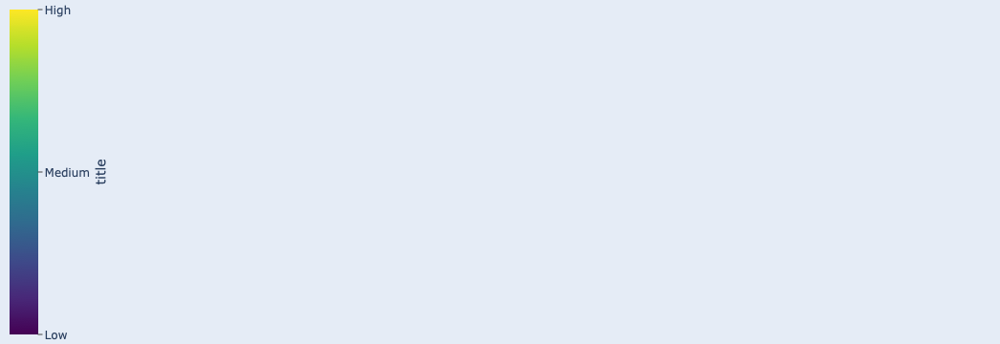

In [98]:
def create_colorbar(values, title, color_scale='viridis'):
    a = np.array([[min(values), max(values)]])
    fig = go.Figure(
        data=[
            go.Heatmap(
                z=a,
                colorscale="viridis",
                showscale=True,
                zmin=a.min(),
                zmax=a.max(),
                colorbar=dict(title='title', titleside='right',
                          ticks='outside', tickvals=[0, 0.5, 1],
                          ticktext=['Low', 'Medium', 'High'],x=0),
            ),
            go.Heatmap(
                z=np.zeros_like(a), # ensure there are enough points to cover the whole image
                colorscale="Picnic_r",  # any colorscale that has white at 0
                showscale=False,
                zmid=0,
            ),
        ],
    )
    fig.update_layout(
        width=75, # 75 seems to work empirically, you may have to adjust the width
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        xaxis_zeroline=False,
        yaxis_zeroline=False,
        xaxis_visible=False,
        yaxis_visible=False,
        margin=dict(l=0, r=0, b=0, t=0), # zeroing the margins gives a tighter figure, and is also important to make the other numbers work out
    )

In [112]:
np.array([[0,1]]).min()

0

In [124]:
# Helper function to create a Plotly colorbar figure
def create_colorbar(values, title, color_scale='viridis'):
    values = np.array([[min(values), max(values)]])
    # color_scale = 'viridis'    
    trace = [go.Heatmap(
        z=values, # [[v] for v in sorted(values)],
        colorscale=color_scale,
        showscale=True,
        zmin=values.min(),
        zmax=values.max(),
        colorbar=dict(title=title, titleside='right',
                      ticks='outside', tickvals=[0, 0.5, 1],
                      ticktext=['Low', 'Medium', 'High'], x=0),
    ),
             go.Heatmap(
            z=np.zeros_like(values), # ensure there are enough points to cover the whole image
            colorscale="Picnic_r",  # any colorscale that has white at 0
            showscale=False,
            zmid=0,
        ),
            ]
    fig = go.Figure(data=trace) # , layout=layout)
    fig.update_layout(
        width=75, # 75 seems to work empirically, you may have to adjust the width
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        xaxis_zeroline=False,
        yaxis_zeroline=False,
        xaxis_visible=False,
        yaxis_visible=False,
        margin=dict(l=0, r=0, b=0, t=0), # zeroing the margins gives a tighter figure, and is also important to make the other numbers work out
    )

    fig.update_traces(hoverinfo='none') # , showscale=True, zmin=values.min(), zmax=values.max())    
    return fig

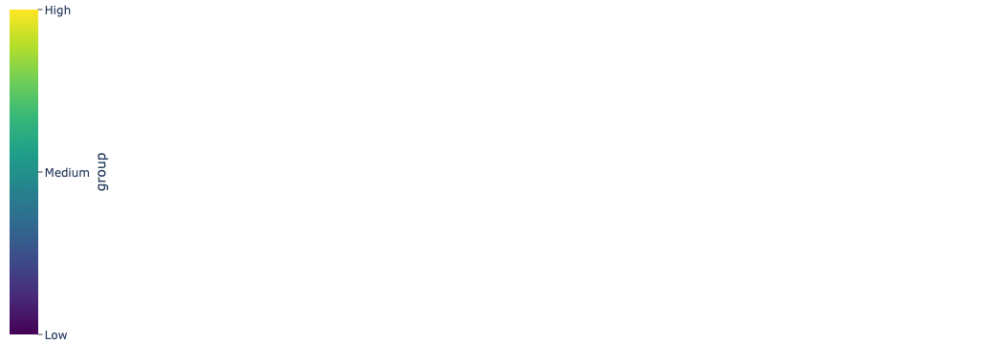

In [123]:
fig = create_colorbar([0,1], 'group')
fig

In [84]:
# # Helper function to create a Plotly colorbar figure
# def create_colorbar(values, title):
#     print(np.zeros_like([[v] for v in sorted(values)]))
#     color_scale = 'Viridis'
#     trace = go.Heatmap(
#         z=[[v] for v in sorted(values)],
#         colorscale=color_scale,
#         showscale=True,
#         colorbar=dict(title=title, titleside='right',
#                      ticks='outside', tickvals=[0, 0.5, 1],
#                      ticktext=['Low', 'Medium', 'High'])
#     )
#     layout = go.Layout(
#         autosize=False,
#         height=300,
#         margin=dict(l=0, r=200, t=0, b=0)
#     )
#     fig = go.Figure(data=[trace, go.Heatmap(
#             z=np.zeros_like([v for v in sorted(values)]), # ensure there are enough points to cover the whole image
#             colorscale="Picnic_r",  # any colorscale that has white at 0
#             showscale=False,
#             zmid=0,
#         )], layout=layout)
#     fig.update_yaxes(visible=False)
#     fig.update_xaxes(visible=False)
#     fig.update_traces(hoverinfo='none', showscale=True, zmin=0, zmax=10.)
#     fig.update_layout(width=115,
#                      xaxis_showgrid=False,
#     # yaxis_showgrid=False,
#     # xaxis_zeroline=False,
#     # yaxis_zeroline=False,
#     # xaxis_visible=False,
#     # yaxis_visible=False,
#                      )
#     return fig


# coloraxis_showscale=True, 
#             coloraxis_colorbar=dict(
#                 title='Score', 
#                 ticks="outside",
#                 tickvals=[0, 0.5, 1],
#                 ticktext=['Low', 'Medium', 'High']
#             ),
#             margin=dict(t=20, b=20, l=80, r=20),
#         ).update_xaxes(visible=False).update_yaxes(visible=False).update_traces(hoverinfo='none', showscale=True, zmin=0, zmax=1),
#         config={'displayModeBar': False}  # Hides the Plotly mode bar
#     )
#     return node_color_map, colorbar_figure_html

# # Generate the color bar with Matplotlib
# # def create_colorbar_fig(colormap, label):
# #     fig, ax = plt.subplots(figsize=(6, 1))
# #     fig.subplots_adjust(bottom=0.5)

# #     norm = mcolors.Normalize(vmin=0, vmax=100)
# #     fig.colorbar(mcolors.ScalarMappable(norm=norm, 
# #                                         # cmap=colormap,
# #                                         cmap=plt.cm.viridis,
# #                                        ), 
# #                  cax=ax, orientation='horizontal', label=label)
        
    
# #     plotly_fig = tls.mpl_to_plotly(fig)
# #     plotly_fig.update_layout(
# #         autosize=False,
# #         margin=dict(l=0, r=0, t=0, b=0)
# #     )

# #     cbar_graph = dcc.Graph(figure=plotly_fig, style={'width': '300px', 'height': '50px'})
    
# #     return cbar_graph
###########

#     colorbar_figure_html = dcc.Graph(
#         # id='node_colorbar_fig',
#         figure=px.imshow([[0, 1]], color_continuous_scale=color_scale, 
#                          aspect='auto').update_layout(
#             coloraxis_showscale=True, 
#             coloraxis_colorbar=dict(
#                 title='Score', 
#                 ticks="outside",
#                 tickvals=[0, 0.5, 1],
#                 ticktext=['Low', 'Medium', 'High']
#             ),
#             margin=dict(t=20, b=20, l=80, r=20),
#         ).update_xaxes(visible=False).update_yaxes(visible=False).update_traces(hoverinfo='none', showscale=True, zmin=0, zmax=1),
#         config={'displayModeBar': False}  # Hides the Plotly mode bar
#     )
    
    
################################
#     #     colorbar_fig = go.Figure() # layout=dict(plot_bgcolor='white')
#     #     colorbar_fig.add_trace(go.Scatter(
#     #         x=[None],
#     #         y=[None],
#     #         mode='markers',
#     #         marker=dict(        
#     #             size=0,
#     #             colorscale='viridis',
#     #             cmin=min(node_colors), # 0,
#     #             cmax=max(node_colors), # 100,
#     #             colorbar=dict(
#     #             title=f"nodes: {label}" ,
#     #             thickness=15,
#     #             len=0.5,
#     #             x=0.3, # 0.5,
#     #             y=0.5, # 0.5,
#     #             xanchor='left',
#     #             # xanchor='center',
#     #             # yanchor='top',
#     #             # orientation='h',
#     #             ),
#     #         ),
#     #         showlegend=False,
#     #         hoverinfo='none'
#     #     ))

#     #     colorbar_fig.update_layout(
#     #         margin=dict(l=0, r=0, t=0, b=0),
#     #         # height=100,
#     #         # width=300,
#     #         height=110, # 40, # 80, # 40, # 200, # 110,
#     #         width=60,# 200, # 120, # 60,
#     #         xaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
#     #         yaxis=dict(showticklabels=False, showgrid=False, zeroline=False)
#     #     )

#     #     colorbar_figure_html = dcc.Graph(figure=colorbar_fig, config={'displayModeBar': False})

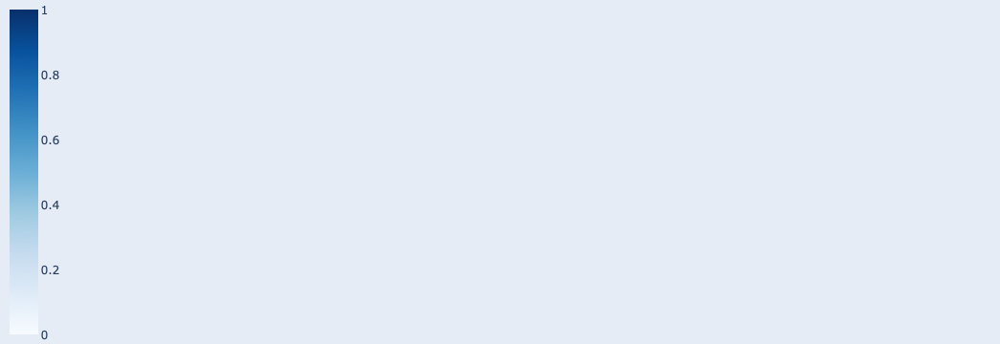

In [94]:
a = np.array([[0, 1]])
fig = go.Figure(
    data=[
        go.Heatmap(
            z=a,
            colorscale="Blues",
            showscale=True,
            zmin=a.min(),
            zmax=a.max(),
            colorbar=dict(x=0),
        ),
        go.Heatmap(
            z=np.zeros_like(a), # ensure there are enough points to cover the whole image
            colorscale="Picnic_r",  # any colorscale that has white at 0
            showscale=False,
            zmid=0,
        ),
    ],
)
fig.update_layout(
    width=75, # 75 seems to work empirically, you may have to adjust the width
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False,
    xaxis_visible=False,
    yaxis_visible=False,
    margin=dict(l=0, r=0, b=0, t=0), # zeroing the margins gives a tighter figure, and is also important to make the other numbers work out
)

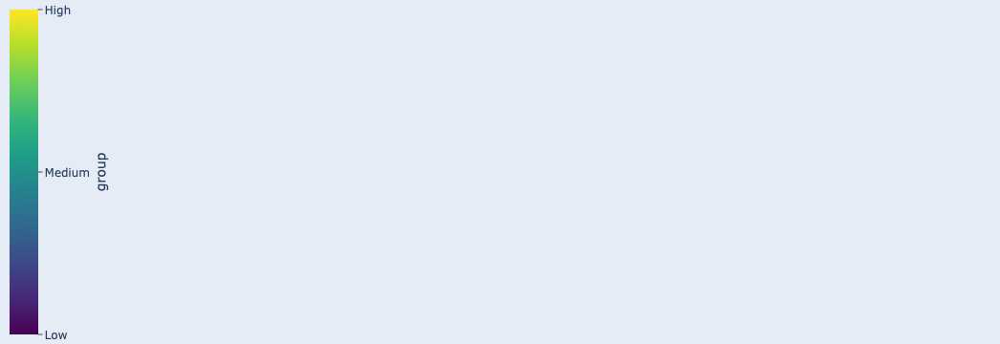

In [100]:
fig = create_colorbar(np.array([0,1]), 'group')
fig

In [76]:
fig.data

(Heatmap({
     'colorbar': {'ticks': 'outside',
                  'ticktext': [Low, Medium, High],
                  'tickvals': [0, 0.5, 1],
                  'title': {'side': 'right', 'text': 'group'}},
     'colorscale': [[0.0, '#440154'], [0.1111111111111111, '#482878'],
                    [0.2222222222222222, '#3e4989'], [0.3333333333333333,
                    '#31688e'], [0.4444444444444444, '#26828e'],
                    [0.5555555555555556, '#1f9e89'], [0.6666666666666666,
                    '#35b779'], [0.7777777777777778, '#6ece58'],
                    [0.8888888888888888, '#b5de2b'], [1.0, '#fde725']],
     'hoverinfo': 'none',
     'showscale': True,
     'z': [[0], [0.1], [0.4], [0.6], [1], [1.3]],
     'zmax': 10.0,
     'zmin': 0
 }),)